<a href="https://colab.research.google.com/github/masalha-alaa/native-language-recognition/blob/master/native_language_classification_dl.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
from google.colab import drive

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau, MultiStepLR
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import torch.utils.data as data_utils

import numpy as np
import pandas as pd
from scipy.sparse import csr_matrix

from pathlib import Path
import zipfile
from pickle import load

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix
from sklearn import utils

from bisect import bisect_left

import random
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import itertools
import copy
from math import ceil


SEED = 42
BATCH_SIZE = 64
K_FOLD = 6

In [2]:
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [3]:
def my_sample(population, k):
    random.seed(SEED)
    return random.sample(population, k)

In [4]:
# Use GPU if available

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Running on {device}')

Running on cuda


In [5]:
# Extract data

ROOT_DATA_DIR = Path("/content/gdrive/MyDrive/reddit-project/")
DATASET_DIR = ROOT_DATA_DIR / "dl_dataset"
TOKENS_CSV_temp = 'tokens_2000.csv'
POS_CSV_temp = 'pos_2000.csv'
VOCAB_DIR = ROOT_DATA_DIR / 'vocabulary'
ONE_K_WORDS_VOCAB = VOCAB_DIR / '1000 most common words.pkl_lst'
ONE_K_POS_TRI_VOCAB = VOCAB_DIR / '1000 most common POS trigrams.pkl_lst'
EN_FUNC_WORDS_VOCAB = VOCAB_DIR / 'en_function_words.pkl_lst'

if not all ([os.path.exists(DATASET_DIR / directory) for directory in [TOKENS_CSV_temp, POS_CSV_temp]]):
    print('Extracting data...')
    if not os.path.exists(DATASET_DIR / TOKENS_CSV_temp):
        with zipfile.ZipFile(DATASET_DIR / 'tokens_2000.zip', 'r') as z:
            z.extractall(DATASET_DIR)
    if not os.path.exists(DATASET_DIR / POS_CSV_temp):
        with zipfile.ZipFile(DATASET_DIR / 'pos_2000.zip', 'r') as z:
            z.extractall(DATASET_DIR)
    print('Done')

print([str(DATASET_DIR / filename) for filename in os.listdir(DATASET_DIR) if filename.endswith('.csv')])
TOKENS_CHUNKS = DATASET_DIR / TOKENS_CSV_temp
POS_CHUNKS = DATASET_DIR / POS_CSV_temp

['/content/gdrive/MyDrive/reddit-project/dl_dataset/tokens_2000.csv', '/content/gdrive/MyDrive/reddit-project/dl_dataset/pos_2000.csv']


In [6]:
DATA = 'data'
LABEL = TARGET = 'label'
NATIVE = 0
NON_NATIVE = 1

In [7]:
NATIVE_COUNTRIES = {'australia', 'england', 'ireland', 'scotland', 'wales', 'uk', 'new zealand', 'us', 'canada'}
COUNTRIES = ['UK', 'England', 'Scotland', 'Wales', 'Ireland',
             'New Zealand', 'Australia',
             'US', 'Canada',
             'Austria', 'Germany', 'Netherlands', 'Norway', 'Sweden',
             'Bulgaria', 'Croatia', 'Slovenia', 'Serbia', 'Lithuania', 'Poland', 'Latvia', 'Russia', 'Slovakia', 'Czech Republic', 'Ukraine',
             'France', 'Italy', 'Portugal', 'Romania', 'Spain']

In [8]:
def plot_confusion_matrix(cm, classes,
                        normalize=False,
                        title='Confusion matrix',
                        cmap=plt.cm.Blues,
                        figsize=None):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """

    def calc_acc(cm):
        correct = 0
        for i in range(len(cm)):
            correct += cm[i][i]
        return correct / cm.sum(axis=1).sum()
    
    cm_acc = calc_acc(cm)

    if figsize is None:
        figsize = (30,10)
    plt.figure(figsize=figsize)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(f'{title}\nAccuracy: {cm_acc*100:.2f}%')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [9]:
class MyKfold():
    def __init__(self, original_ds, k, batch_size, shuffle_within_folds, collate_fn=None):
        # self.dataset = copy.deepcopy(original_ds)
        self.dataset = original_ds
        self.k = k
        self.batch_size = batch_size
        self.shuffle_within_folds = shuffle_within_folds
        self.collate_fn = collate_fn
    def split(self):
        test_fold_size = ceil(len(self.dataset) / self.k)
        for i in range(0, len(self.dataset), test_fold_size):
            test_idx = list(range(i,min(i+test_fold_size, len(self.dataset))))
            train_idx = [j for j in range(i)] + [j for j in range(i+test_fold_size,len(self.dataset))]

            # print(f'len(self.dataset) = {len(self.dataset)}')
            print('-----------------------------------')
            print(f'len(train_idx) = {len(train_idx)}')
            print(f'len(test_idx) = {len(test_idx)}')
            # print(f'train lbls = {np.unique([self.dataset.labels[lbl] for lbl in train_idx], return_counts=True)})')
            # print(f'test lbls = {np.unique([self.dataset.labels[lbl] for lbl in test_idx], return_counts=True)})')
            # print(f'self.batch_size = {self.batch_size}')
            
            test_loader = DataLoader(data_utils.Subset(self.dataset, test_idx),
                                     batch_size=self.batch_size,
                                     collate_fn=self.collate_fn,
                                     shuffle=self.shuffle_within_folds)
            train_loader = DataLoader(data_utils.Subset(self.dataset, train_idx),
                                      batch_size=self.batch_size,
                                      collate_fn=self.collate_fn,
                                      shuffle=self.shuffle_within_folds)
            
            # print(f'len(train_loader) = {len(train_loader)}')
            # print(f'len(test_loader) = {len(test_loader)}')
            
            yield train_loader, test_loader



In [10]:
class MyDataset(Dataset):
    def __init__(self, dataframe, vocabulary_path, vectorizer=None, vectorizer_type=None, ngrams=(1,1), remove_stop_words=True):
        with open(vocabulary_path, mode='rb') as f:
            vocabulary = load(f)
        # print(vocabulary)
        
        if vectorizer:
            self.vectorizer = vectorizer
            self.sequences = self.vectorizer.transform(dataframe[DATA].tolist())
        else:
            if vectorizer_type is None:
                vectorizer_type = 'binary'
            if vectorizer_type == 'binary':
                self.vectorizer = CountVectorizer(vocabulary=vocabulary, stop_words='english' if remove_stop_words else None, ngram_range=ngrams, binary=True)  # TODO: Try with and without stop_words
            elif vectorizer_type == 'tfidf':
                self.vectorizer = TfidfVectorizer(vocabulary=vocabulary, stop_words='english' if remove_stop_words else None, ngram_range=ngrams, use_idf=True)
            else:
                raise NotImplementedError('binary / tfidf / None (default)')
            self.sequences = self.vectorizer.fit_transform(dataframe[DATA].tolist())
        self.labels = dataframe[LABEL].tolist()
        self.token2idx = self.vectorizer.vocabulary_
        # self.idx2token = {idx: token for token, idx in self.token2idx.items()}  # do i need dis?
    
    def __getitem__(self, i):
        return self.sequences[i, :].toarray(), self.labels[i]
    
    def __len__(self):
        return self.sequences.shape[0]

In [11]:
class MyConcatDataset(MyDataset):
    def __init__(self, datasets, shuffle=False):
        # datasets type: list of MyDataset
        features_df = pd.DataFrame()
        for d,dataset in enumerate(datasets):
            # pd.DataFrame(dataset.sequences, columns=sorted(dataset.token2idx, key=dataset.token2idx.get)).to_csv(f'dataset_{d}.csv')
            features_df = pd.concat([features_df,
                                     pd.DataFrame(dataset.sequences.toarray(), columns=dataset.token2idx)],
                                    axis=1)
        
        self.labels = datasets[0].labels.copy()  # labels should be the same for all given datasets

        if shuffle:
            features_df, self.labels = utils.shuffle(features_df, self.labels)
        
        # print(features_df.iloc[:5,:30])
        # print(features_df.iloc[:5,500:550])
        # print(features_df.iloc[:5,-30:])
        
        # features_df.to_csv('features_df.csv')
        # print(features_df.values)
        self.sequences = csr_matrix(features_df.values)
        
        self.token2idx = features_df.columns

    # def __getitem__(self, i):
    #     return self.sequences[i, :].toarray(), self.labels[i]
    
    # def __len__(self):
    #     return self.sequences.shape[0]

In [55]:
class LanguageFamilies:
    # Sets inside dictionaries so the lookup will be fast. The order here doesn't matter.
    _families = {'English': {'Australia', 'England', 'Ireland', 'Scotland', 'Wales', 'UK', 'New Zealand', 'US',
                             'Canada', },
                 'Germanic': {'Austria', 'Germany', 'Denmark', 'Netherlands', 'Norway', 'Sweden', 'Iceland'},
                 'Slavic': {'Bosnia', 'Bulgaria', 'Croatia', 'Czech Republic', 'Latvia', 'Lithuania', 'Poland',
                            'Russia', 'Serbia', 'Slovakia', 'Slovenia', 'Ukraine', },
                 'Romance': {'France', 'Italy', 'Portugal', 'Romania', 'Spain', 'Mexico', }}

    @staticmethod
    def get_whole_family(family_name):
        return LanguageFamilies._families.get(family_name)

    @staticmethod
    def get_country_fam(country_name):
        for k, v in LanguageFamilies._families.items():
            if country_name in v:
                return k
        return None

In [59]:
# Split to train / test

def prepare_data(path, data_type, min_chunks_per_country, max_chunks_per_non_native_country, train_cpc, test_cpc):
    """
    :param min_chunks_per_country: applicable only for 'binary'!
    :param max_chunks_per_non_native_country: applicable only for 'binary'!
    :param train_cpc: applicable only for non 'binary'!
    :param test_cpc: applicable only for non 'binary'!
    """
    # cpc = chunks per country
    
    df = pd.read_csv(path)
    df = df.drop(df.columns[0], axis=1)  # first column is index
    
    if data_type == 'binary':
        groups = df.groupby(LABEL)
        # shuffle inner groups
        # the static random_state is mandatory, because we prepare multiple dataframes and expect the same indexing
        groups = groups.filter(lambda group: len(group) >= min_chunks_per_country).groupby(LABEL).sample(frac=1, random_state=SEED).groupby(LABEL)

        native_idx, non_native_idx = [], []
        for group in groups:
            if group[0].lower() in NATIVE_COUNTRIES:
                # if native, take all chunks
                native_idx.extend(group[1].index)
            else:
                # non native, take up to max
                non_native_idx.extend(group[1].index[:max_chunks_per_non_native_country])
        # I already know there are enough samples...
        print(f'native: {len(native_idx)}')
        print(f'non-native: {len(non_native_idx)}')
        class_size = 700  # max 1659

        native_idx = my_sample(native_idx, class_size)
        non_native_idx = my_sample(non_native_idx, class_size)
        training_size_per_class = 600
        test_size_per_class = class_size - training_size_per_class
        print(f'Training size: {training_size_per_class*2}')
        print(f'Test size: {test_size_per_class*2}')
        training_df = df.loc[native_idx[:training_size_per_class] + non_native_idx[:training_size_per_class]].reset_index(drop=True)
        test_df = df.loc[native_idx[training_size_per_class:] + non_native_idx[training_size_per_class:]].reset_index(drop=True)

        training_df[LABEL] = [NATIVE] * training_size_per_class + [NON_NATIVE] * training_size_per_class
        test_df[LABEL] = [NATIVE] * test_size_per_class + [NON_NATIVE] * test_size_per_class
    elif data_type == 'language':
        groups = df.groupby(LABEL)
        # for group in groups:
        #     print(group[0], len(group[1].index))
        # print('')

        # shuffle inner groups
        # the static random_state is mandatory, because we prepare multiple dataframes and expect the same indexing
        groups = groups.filter(lambda group: len(group) > train_cpc).groupby(LABEL).sample(frac=1, random_state=SEED).groupby(LABEL)

        d_train = {}
        d_test = {}
        countries_set = set([country.lower() for country in COUNTRIES])  # or set it to None to work with all countries

        for group in groups:
            # print(group[0], len(group[1].index))
            if countries_set is None or group[0].lower() in countries_set:
                d_train[group[0].lower()] = group[1].index[:train_cpc].tolist()
                d_test[group[0].lower()] = group[1].index[train_cpc:train_cpc + test_cpc].tolist()
        # print('')

        training_df = df.loc[sum(d_train.values(), [])].reset_index(drop=True)
        test_df = df.loc[sum(d_test.values(), [])].reset_index(drop=True)

        print(f'num of countries: {len(d_train.keys())}')
        print(f'Training size: {training_df.shape[0]}')
        print(f'Test size: {test_df.shape[0]}')

        # encode labels
        le = LabelEncoder()
        # le.fit(sort_a_by_b(pd.unique(training_df[LABEL]), COUNTRIES))
        training_df[LABEL] = le.fit_transform(training_df[LABEL])
        test_df[LABEL] = le.transform(test_df[LABEL])
    elif data_type == 'family':
        df[LABEL] = df[LABEL].apply(lambda country: LanguageFamilies.get_country_fam(country))
        # print(df[LABEL])
        groups = df.groupby(LABEL)
        for group in groups:
            print(group[0], len(group[1].index))
        print('')

        # shuffle inner groups
        # the static random_state is mandatory, because we prepare multiple dataframes and expect the same indexing
        groups = groups.filter(lambda group: len(group) > train_cpc).groupby(LABEL).sample(frac=1, random_state=SEED).groupby(LABEL)

        d_train = {}
        d_test = {}
        # countries_set = set([country.lower() for country in COUNTRIES])  # or set it to None to work with all countries

        for group in groups:
            # print(group[0], len(group[1].index))
            if group[0] is not None:
                d_train[group[0].lower()] = group[1].index[:train_cpc].tolist()
                d_test[group[0].lower()] = group[1].index[train_cpc:train_cpc + test_cpc].tolist()
        # print('')

        training_df = df.loc[sum(d_train.values(), [])].reset_index(drop=True)
        test_df = df.loc[sum(d_test.values(), [])].reset_index(drop=True)

        print(f'num of families: {len(d_train.keys())}')
        print(f'Training size: {training_df.shape[0]}')
        print(f'Test size: {test_df.shape[0]}')

        # encode labels
        le = LabelEncoder()
        # le.fit(sort_a_by_b(pd.unique(training_df[LABEL]), COUNTRIES))
        training_df[LABEL] = le.fit_transform(training_df[LABEL])
        test_df[LABEL] = le.transform(test_df[LABEL])
    else:
        raise NotImplementedError()
    
    return training_df, test_df

In [13]:
def collate(batch):
    inputs = torch.FloatTensor([item[0] for item in batch])
    target = torch.LongTensor([item[1] for item in batch])
    return inputs, target

def build_dataloader(train_dfs, test_dfs, ngrams, vocab_paths, remove_stop_words=True, collate_fn=False, vectorizer_type=None):
    # def collate(batch):
    #     inputs = torch.FloatTensor([item[0] for item in batch])
    #     target = torch.LongTensor([item[1] for item in batch])
    #     return inputs, target
    
    if isinstance(remove_stop_words, bool):
        remove_stop_words = [remove_stop_words] * len(vocab_paths)
    training_datasets, test_datasets = [], []
    for train_df, test_df, ngram, vocab_path, stop_words in zip(train_dfs, test_dfs, ngrams, vocab_paths, remove_stop_words):
        training_dataset = MyDataset(train_df, vocab_path, ngrams=ngram, vectorizer_type=vectorizer_type, remove_stop_words=stop_words)
        test_dataset = MyDataset(test_df, vocab_path, training_dataset.vectorizer, ngrams=ngram, vectorizer_type=vectorizer_type, remove_stop_words=stop_words)

        training_datasets.append(training_dataset)
        test_datasets.append(test_dataset)
    
    training_dataset = MyConcatDataset(training_datasets, shuffle=True)
    # training_loader = DataLoader(training_dataset, batch_size=BATCH_SIZE, collate_fn=collate if collate_fn else None, shuffle=True)

    test_dataset = MyConcatDataset(test_datasets)
    # test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, collate_fn=collate if collate_fn else None, shuffle=True)

    # return training_loader, test_loader, len(training_dataset.token2idx)
    return training_dataset, test_dataset, len(training_dataset.token2idx)

In [14]:
class BinaryClassifierFC(nn.Module):
    def __init__(self, in_features):
        super(BinaryClassifierFC, self).__init__()
        self.fc1 = nn.Linear(in_features, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 64)
        self.fc4 = nn.Linear(64, 2)
    
    def forward(self, x):
        x = F.relu(self.fc1(x.squeeze(1).float()))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        return F.softmax(self.fc4(x))

In [15]:
class LanguageClassifierFC(nn.Module):
    def __init__(self, in_features, num_classes):
        super(LanguageClassifierFC, self).__init__()
        self.fc1 = nn.Linear(in_features, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, 256)
        self.fc4 = nn.Linear(256, 256)
        self.fc5 = nn.Linear(256, 128)
        self.fc6 = nn.Linear(128, 64)
        self.fc7 = nn.Linear(64, num_classes)
    
    def forward(self, x):
        x = F.dropout(F.relu(self.fc1(x.squeeze(1).float())), 0.3)
        x = F.relu(self.fc2(x))
        x = F.dropout(F.relu(self.fc3(x)), 0.3)
        x = F.relu(self.fc4(x))
        x = F.dropout(F.relu(self.fc5(x)), 0.3)
        x = F.relu(self.fc6(x))
        return F.softmax(self.fc7(x))

In [16]:
class LanguageClassifierRNN(nn.Module):
    def __init__(self, input_size, num_classes):
        super(LanguageClassifierRNN, self).__init__()
        self.hidden_size = 256
        self.num_layers = 2
        self.rnn = nn.RNN(input_size, self.hidden_size, self.num_layers, batch_first=True)
        seq_length = 1
        self.fc = nn.Linear(self.hidden_size * seq_length, num_classes)
    
    def init_hidden(self, input_size):
        return torch.randn(self.num_layers, input_size, self.hidden_size).to(device)

    def forward(self, x):
        h0 = self.init_hidden(x.size(0))

        out, _ = self.rnn(x, h0)
        out = out.reshape(out.shape[0], -1)
        out = self.fc(out)
        return out

In [17]:
class LanguageClassifierGRU(nn.Module):
    def __init__(self, input_size, num_classes):
        super(LanguageClassifierGRU, self).__init__()
        self.hidden_size = 128
        self.num_layers = 1
        self.rnn = nn.GRU(input_size, self.hidden_size, self.num_layers, batch_first=True)
        seq_length = 1
        self.fc = nn.Linear(self.hidden_size * seq_length, num_classes)
    
    def init_hidden(self, input_size):
        return torch.randn(self.num_layers, input_size, self.hidden_size).to(device)

    def forward(self, x):
        h0 = self.init_hidden(x.size(0))

        out, _ = self.rnn(x, h0)
        out = out.reshape(out.shape[0], -1)
        out = self.fc(out)
        return out


In [18]:
class LanguageClassifierLSTM(nn.Module):
    def __init__(self, input_size, num_classes):
        super(LanguageClassifierLSTM, self).__init__()
        self.hidden_size = 128
        self.num_layers = 1
        self.rnn = nn.LSTM(input_size, self.hidden_size, self.num_layers, batch_first=True)
        seq_length = 1
        self.fc = nn.Linear(self.hidden_size * seq_length, num_classes)
    
    def init_hidden(self, input_size):
        return torch.randn(self.num_layers, input_size, self.hidden_size).to(device)

    def forward(self, x):
        h0 = self.init_hidden(x.size(0))
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(device)

        out, _ = self.rnn(x, (h0, c0))
        out = out.reshape(out.shape[0], -1)
        # out = self.fc(out[:, -1, :])
        out = self.fc(out)
        return out

In [19]:
class LanguageClassifierGRUEmbed(nn.Module):
    def __init__(self, input_size, num_classes):
        super(LanguageClassifierGRUEmbed, self).__init__()
        self.hidden_size = 128
        self.num_layers = 1

        embedding_dimension = 100
        self.encoder = nn.Embedding(input_size, embedding_dimension)
        self.rnn = nn.GRU(embedding_dimension, self.hidden_size, self.num_layers, batch_first=True)
        seq_length = 1
        self.fc = nn.Linear(self.hidden_size * seq_length, num_classes)
    
    def init_hidden(self, input_size):
        return torch.randn(self.num_layers, input_size, self.hidden_size).to(device)

    def forward(self, x):
        h0 = self.init_hidden(x.size(0))

        encoded = self.encoder(x).squeeze()
        # print(f'encoded.shape = {encoded.shape}')
        out, _ = self.rnn(encoded, h0)
        # out = out.reshape(out.shape[0], -1)
        out = self.fc(out[:, -1, :]).squeeze()
        return out


In [20]:
def weight_reset(m):
    if isinstance(m, nn.Linear) or isinstance(m, nn.RNN) or isinstance(m, nn.GRU) or isinstance(m, nn.LSTM):
        m.reset_parameters()

In [21]:
def train_cv(model, training_set, lr, epochs, collate_fn=False):
    # criterion = nn.BCEWithLogitsLoss()  # From PyTorch: This loss combines a Sigmoid layer and the BCELoss in one single class.
                                        # This version is more numerically stable than using a plain Sigmoid followed by a BCELoss.

    criterion = nn.CrossEntropyLoss()
    # optimizer = optim.Adam(model.parameters(), lr=0.001)  # TODO: Try
    optimizer = optim.Adam([p for p in model.parameters() if p.requires_grad], lr=lr)
    # scheduler = MultiStepLR(optimizer, milestones=[25,50,75], gamma=0.10)

    model.train(mode=True)  # Put model in training mode
    train_losses, train_acc = [], []
    val_losses, val_acc = [], []
    y_preds, y_true = [], []  # for confusion matrix
    my_kfold = MyKfold(training_set, k=K_FOLD, batch_size=BATCH_SIZE, shuffle_within_folds=True, collate_fn=collate if collate_fn else None)
    fold_train_acc_lst, fold_train_loss_lst = [0] * epochs, [0] * epochs
    fold_val_acc_lst, fold_val_loss_lst = [0] * epochs, [0] * epochs
    fold_num = 0  # need this to be outside
    for training_loader_k, test_loader_k in my_kfold.split():
        fold_num += 1
        # reset model params on each fold
        model.apply(weight_reset)
        # model = BinaryClassifierFC(1000)
        print(f'\nFold {fold_num}..........')
        # print(f'len(training_loader_k) = {len(training_loader_k)}')
        # print(f'len(test_loader_k) = {len(test_loader_k)}')
        for epoch in range(epochs):
            progress_bar = tqdm(training_loader_k, leave=False)
            currnet_train_losses, current_train_acc = [], []

            # if epoch == 55:
            #     print('decreasing learning rate...')
            #     for g in optimizer.param_groups:
            #         g['lr'] /= 10

            # if epoch == 80:
            #     print('decreasing learning rate...')
            #     for g in optimizer.param_groups:
            #         g['lr'] /= 10

            for data, labels in progress_bar:
                data, labels = data.to(device), labels.to(device)
                # print(f'training batch = {np.unique(labels.cpu().numpy(), return_counts=True)}')

                model.zero_grad()

                output = model(data)
                # loss = criterion(output.squeeze(), labels.float())
                loss = criterion(output, labels)
                
                loss.backward()
                    
                nn.utils.clip_grad_norm_(model.parameters(), 3)  # ??

                optimizer.step()
                # scheduler.step()
                
                progress_bar.set_description(f'Training Loss: {loss.item():.3f}')
                
                currnet_train_losses.append(loss.item())

                # predictions = torch.sigmoid(output.squeeze().data)
                # predictions = np.array([p > 0.5 for p in predictions])
                predictions = output.argmax(dim=1).cpu().numpy()
                # print(f'labels = {labels.cpu()}')
                # print(f'predictions = {predictions}')
                acc = (predictions == labels.cpu().numpy()).mean()
                current_train_acc.append(acc)
            
            epoch_loss = np.average(currnet_train_losses)
            train_losses.append(epoch_loss)

            epoch_acc = np.average(current_train_acc)
            train_acc.append(epoch_acc)

            ###################################################
            # predict validation data, but first disable gradient tracking, and enter evaluation mode
            model.train(mode=False)  # enter eval mode
            val_labels_lst, val_preds_list = [], []  # for confusion matrix
            with torch.no_grad():  # locally disable gradient tracking
                current_val_losses, current_val_acc = [], []
                progress_bar_val = tqdm(test_loader_k, leave=False)
                for val_data, val_labels in progress_bar_val:
                    val_data, val_labels = val_data.to(device), val_labels.to(device)
                    # print(f'test batch = {np.unique(val_labels.cpu().numpy(), return_counts=True)}')
                    
                    val_output = model(val_data)
                    # val_loss = criterion(val_output.squeeze(), val_labels.float())
                    val_loss = criterion(val_output, val_labels)

                    progress_bar_val.set_description(f'Val Loss: {loss.item():.3f}')

                    current_val_losses.append(val_loss.item())

                    # val_preds = torch.sigmoid(val_output.squeeze().data)
                    # val_preds = np.array([p > 0.5 for p in val_preds])
                    val_preds = val_output.argmax(dim=1).cpu().numpy()
                    val_preds_list.extend(val_preds)
                    val_labels_lst.extend(val_labels.cpu().numpy())
                    # print(f'val_labels = {val_labels.cpu().numpy()}')
                    # print(f'val_preds = {val_preds}')
                    acc = (val_preds == val_labels.cpu().numpy()).mean()
                    current_val_acc.append(acc)
                
                epoch_loss_val = np.average(current_val_losses)
                val_losses.append(epoch_loss_val)

                epoch_acc_val = np.average(current_val_acc)
                val_acc.append(epoch_acc_val)
            model.train(mode=True)  # exit eval mode, re-enter training mode
            ###################################################
            
            # take epoch-wise acc and loss (average later)
            fold_train_acc_lst[epoch] += epoch_acc
            fold_val_acc_lst[epoch] += epoch_acc_val
            fold_train_loss_lst[epoch] += epoch_loss
            fold_val_loss_lst[epoch] += epoch_loss_val

            tqdm.write(f'Epoch #{epoch + 1}\tTrain Loss: {epoch_loss:.3f}\tValidation Loss: {epoch_loss_val:.3f}\tTrain Acc:{epoch_acc:.2f}\tValidation Acc:{epoch_acc_val:.2f}')
        
        # epochs end for currnet fold

        # take predictions of last epoch, because they're the most accurate (this is for confusion matrix)
        # print('Appending:')
        # print(f'val_labels = {val_labels}')
        # print(f'val_preds = {val_preds}')
        # print(f'len(val_preds) = {len(val_preds_list)}')
        y_true.extend(val_labels_lst)
        y_preds.extend(val_preds_list)
        
    # take epoch-wise average acc and loss
    fold_train_acc_lst = [acc / fold_num for acc in fold_train_acc_lst]
    fold_val_acc_lst = [acc / fold_num for acc in fold_val_acc_lst]
    fold_train_loss_lst = [acc / fold_num for acc in fold_train_loss_lst]
    fold_val_loss_lst = [acc / fold_num for acc in fold_val_loss_lst]
    
    return train_acc, val_acc, train_losses, val_losses, fold_train_acc_lst, fold_train_loss_lst, fold_val_acc_lst, fold_val_loss_lst, y_true, y_preds

In [22]:
def plot_graphs(train_acc_lst, val_acc_lst, train_loss_lst, val_loss_lst):
    plt.figure(figsize=(30,10))

    # accuracy
    plt.subplot(2,4,1)
    plt.ylim(0, 1.1)
    plt.plot(range(len(train_acc_lst)), train_acc_lst)
    plt.plot(range(len(val_acc_lst)), val_acc_lst)
    plt.legend(['training acc', 'val acc'])

    # loss
    plt.subplot(2,4,2)
    plt.ylim(0, max(1, max(train_loss_lst + val_loss_lst)) + 0.1 )
    plt.plot(range(len(train_loss_lst)), train_loss_lst)
    plt.plot(range(len(val_loss_lst)), val_loss_lst)
    plt.legend(['training loss', 'val loss'])

    plt.show()

In [62]:
# can add more shortcut funcs

def most_common_1k_words_binary_ftr_vec(classificaiton_type, lr=0.001, epochs=10, num_classes=-1, collate_fn=False, classifier=None, figsize=None):
    training_set, _, num_ftrs = build_dataloader([training_df_toks], [test_df_toks], [(1,1)], [ONE_K_WORDS_VOCAB], collate_fn, vectorizer_type='binary')

    if classifier is None:
        if classificaiton_type == 'binary':
            model = BinaryClassifierFC(num_ftrs)
            # model = LanguageClassifierLSTM(num_ftrs, 2)
        elif classificaiton_type == 'language':
            # model = LanguageClassifierFC(num_ftrs, num_classes)
            # model = LanguageClassifierRNN(num_ftrs, num_classes)
            model = LanguageClassifierGRU(num_ftrs, num_classes)
            # model = LanguageClassifierLSTM(num_ftrs, num_classes)
            # model = LanguageClassifierGRUEmbed(num_ftrs, num_classes)
        elif classificaiton_type == 'family':
            model = LanguageClassifierLSTM(num_ftrs, num_classes)
        else:
            raise NotImplementedError()
    else:
        if classifier == 'lstm':
            model = LanguageClassifierLSTM(num_ftrs, num_classes)
        elif classifier == 'gru':
            model = LanguageClassifierGRU(num_ftrs, num_classes)
        elif classifier == 'fc':
            model = BinaryClassifierFC(num_ftrs)
        else:
            raise NotImplementedError()

    model.to(device)
    print(model)

    train_acc_lst, val_acc_lst, train_loss_lst, val_loss_lst, fold_train_acc_lst, fold_train_loss_lst, fold_val_acc_lst, fold_val_loss_lst, y_true, y_preds = train_cv(model, training_set, lr, epochs, collate_fn)

    plot_graphs(fold_train_acc_lst, fold_val_acc_lst, fold_train_loss_lst, fold_val_loss_lst)

    cm_plot_labels = list(range(training_df_toks[LABEL].nunique()))
    cm = confusion_matrix(y_true=y_true, y_pred=y_preds)
    plot_confusion_matrix(cm=cm, classes=cm_plot_labels, title='Confusion Matrix', figsize=figsize)

In [67]:
def most_common_1k_pos_tri_and_fw(classificaiton_type, lr=0.001, epochs=10, num_classes=-1, collate_fn=False, classifier=None, figsize=None):
    training_set, _, num_ftrs = build_dataloader([training_df_pos, training_df_toks],
                                                 [test_df_pos, test_df_toks],
                                                 [(3,3), (1,1)],
                                                 [ONE_K_POS_TRI_VOCAB, EN_FUNC_WORDS_VOCAB],
                                                 collate_fn=collate_fn,
                                                 vectorizer_type='tfidf',
                                                 remove_stop_words=[False, False])

    if classifier is None:
        if classificaiton_type == 'binary':
            model = BinaryClassifierFC(num_ftrs)
            # model = LanguageClassifierLSTM(num_ftrs, 2)
        elif classificaiton_type == 'language':
            # model = LanguageClassifierFC(num_ftrs, num_classes)
            # model = LanguageClassifierRNN(num_ftrs, num_classes)
            # model = LanguageClassifierGRU(num_ftrs, num_classes)
            model = LanguageClassifierLSTM(num_ftrs, num_classes)
            # model = LanguageClassifierGRUEmbed(num_ftrs, num_classes)
        elif classificaiton_type == 'family':
            model = LanguageClassifierLSTM(num_ftrs, num_classes)
        else:
            raise NotImplementedError()
    else:
        if classifier == 'lstm':
            model = LanguageClassifierLSTM(num_ftrs, num_classes)
        elif classifier == 'gru':
            model = LanguageClassifierGRU(num_ftrs, num_classes)
        elif classifier == 'fc':
            model = BinaryClassifierFC(num_ftrs)
        else:
            raise NotImplementedError()

    model.to(device)
    print(model)

    train_acc_lst, val_acc_lst, train_loss_lst, val_loss_lst, fold_train_acc_lst, fold_train_loss_lst, fold_val_acc_lst, fold_val_loss_lst, y_true, y_preds = train_cv(model, training_set, lr, epochs, collate_fn)

    plot_graphs(fold_train_acc_lst, fold_val_acc_lst, fold_train_loss_lst, fold_val_loss_lst)

    cm_plot_labels = list(range(training_df_toks[LABEL].nunique()))
    cm = confusion_matrix(y_true=y_true, y_pred=y_preds)
    plot_confusion_matrix(cm=cm, classes=cm_plot_labels, title='Confusion Matrix', figsize=figsize)

## Binary Nativity

In [41]:
training_df_pos, test_df_pos = prepare_data(POS_CHUNKS, 'binary', 20, 50, -1, -1)
training_df_toks, test_df_toks = prepare_data(TOKENS_CHUNKS, 'binary', 20, 50, -1, -1)

native: 2181
non-native: 1659
Training size: 1200
Test size: 200
native: 2181
non-native: 1659
Training size: 1200
Test size: 200


### Most Common 1K words, Binary Feature Vector

BinaryClassifierFC(
  (fc1): Linear(in_features=1000, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=64, bias=True)
  (fc4): Linear(in_features=64, out_features=2, bias=True)
)
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 1..........


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  del sys.path[0]


Epoch #1	Train Loss: 0.674	Validation Loss: 0.618	Train Acc:0.66	Validation Acc:0.96


Epoch #2	Train Loss: 0.505	Validation Loss: 0.388	Train Acc:0.96	Validation Acc:0.97


Epoch #3	Train Loss: 0.358	Validation Loss: 0.341	Train Acc:0.98	Validation Acc:0.98


Epoch #4	Train Loss: 0.328	Validation Loss: 0.334	Train Acc:0.99	Validation Acc:0.98


Epoch #5	Train Loss: 0.320	Validation Loss: 0.335	Train Acc:1.00	Validation Acc:0.98


Epoch #6	Train Loss: 0.315	Validation Loss: 0.331	Train Acc:1.00	Validation Acc:0.99


Epoch #7	Train Loss: 0.314	Validation Loss: 0.330	Train Acc:1.00	Validation Acc:0.98


Epoch #8	Train Loss: 0.314	Validation Loss: 0.352	Train Acc:1.00	Validation Acc:0.96


Epoch #9	Train Loss: 0.314	Validation Loss: 0.331	Train Acc:1.00	Validation Acc:0.99


Epoch #10	Train Loss: 0.314	Validation Loss: 0.328	Train Acc:1.00	Validation Acc:0.99
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 2..........


Epoch #1	Train Loss: 0.663	Validation Loss: 0.578	Train Acc:0.67	Validation Acc:0.66


Epoch #2	Train Loss: 0.440	Validation Loss: 0.401	Train Acc:0.91	Validation Acc:0.91


Epoch #3	Train Loss: 0.329	Validation Loss: 0.342	Train Acc:0.99	Validation Acc:0.98


Epoch #4	Train Loss: 0.318	Validation Loss: 0.397	Train Acc:1.00	Validation Acc:0.90


Epoch #5	Train Loss: 0.316	Validation Loss: 0.401	Train Acc:1.00	Validation Acc:0.88


Epoch #6	Train Loss: 0.315	Validation Loss: 0.411	Train Acc:1.00	Validation Acc:0.89


Epoch #7	Train Loss: 0.314	Validation Loss: 0.357	Train Acc:1.00	Validation Acc:0.95


Epoch #8	Train Loss: 0.314	Validation Loss: 0.346	Train Acc:1.00	Validation Acc:0.97


Epoch #9	Train Loss: 0.313	Validation Loss: 0.346	Train Acc:1.00	Validation Acc:0.97


Epoch #10	Train Loss: 0.313	Validation Loss: 0.344	Train Acc:1.00	Validation Acc:0.97
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 3..........


Epoch #1	Train Loss: 0.678	Validation Loss: 0.664	Train Acc:0.60	Validation Acc:0.46


Epoch #2	Train Loss: 0.480	Validation Loss: 0.359	Train Acc:0.89	Validation Acc:0.98


Epoch #3	Train Loss: 0.331	Validation Loss: 0.327	Train Acc:0.99	Validation Acc:0.99


Epoch #4	Train Loss: 0.316	Validation Loss: 0.337	Train Acc:1.00	Validation Acc:0.98


Epoch #5	Train Loss: 0.314	Validation Loss: 0.331	Train Acc:1.00	Validation Acc:0.98


Epoch #6	Train Loss: 0.314	Validation Loss: 0.326	Train Acc:1.00	Validation Acc:0.99


Epoch #7	Train Loss: 0.314	Validation Loss: 0.333	Train Acc:1.00	Validation Acc:0.99


Epoch #8	Train Loss: 0.314	Validation Loss: 0.327	Train Acc:1.00	Validation Acc:0.99


Epoch #9	Train Loss: 0.313	Validation Loss: 0.326	Train Acc:1.00	Validation Acc:0.99


Epoch #10	Train Loss: 0.313	Validation Loss: 0.326	Train Acc:1.00	Validation Acc:0.99
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 4..........


Epoch #1	Train Loss: 0.659	Validation Loss: 0.522	Train Acc:0.64	Validation Acc:0.96


Epoch #2	Train Loss: 0.422	Validation Loss: 0.355	Train Acc:0.92	Validation Acc:0.97


Epoch #3	Train Loss: 0.330	Validation Loss: 0.335	Train Acc:0.99	Validation Acc:0.98


Epoch #4	Train Loss: 0.321	Validation Loss: 0.340	Train Acc:0.99	Validation Acc:0.98


Epoch #5	Train Loss: 0.316	Validation Loss: 0.341	Train Acc:1.00	Validation Acc:0.97


Epoch #6	Train Loss: 0.314	Validation Loss: 0.351	Train Acc:1.00	Validation Acc:0.95


Epoch #7	Train Loss: 0.314	Validation Loss: 0.337	Train Acc:1.00	Validation Acc:0.97


Epoch #8	Train Loss: 0.314	Validation Loss: 0.335	Train Acc:1.00	Validation Acc:0.97


Epoch #9	Train Loss: 0.314	Validation Loss: 0.335	Train Acc:1.00	Validation Acc:0.97


Epoch #10	Train Loss: 0.313	Validation Loss: 0.335	Train Acc:1.00	Validation Acc:0.97
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 5..........


Epoch #1	Train Loss: 0.673	Validation Loss: 0.602	Train Acc:0.65	Validation Acc:0.98


Epoch #2	Train Loss: 0.430	Validation Loss: 0.349	Train Acc:0.96	Validation Acc:0.97


Epoch #3	Train Loss: 0.324	Validation Loss: 0.350	Train Acc:0.99	Validation Acc:0.97


Epoch #4	Train Loss: 0.317	Validation Loss: 0.319	Train Acc:1.00	Validation Acc:1.00


Epoch #5	Train Loss: 0.314	Validation Loss: 0.369	Train Acc:1.00	Validation Acc:0.94


Epoch #6	Train Loss: 0.316	Validation Loss: 0.323	Train Acc:1.00	Validation Acc:0.99


Epoch #7	Train Loss: 0.314	Validation Loss: 0.331	Train Acc:1.00	Validation Acc:0.98


Epoch #8	Train Loss: 0.314	Validation Loss: 0.322	Train Acc:1.00	Validation Acc:0.99


Epoch #9	Train Loss: 0.313	Validation Loss: 0.320	Train Acc:1.00	Validation Acc:1.00


Epoch #10	Train Loss: 0.313	Validation Loss: 0.321	Train Acc:1.00	Validation Acc:1.00
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 6..........


Epoch #1	Train Loss: 0.686	Validation Loss: 0.671	Train Acc:0.57	Validation Acc:0.55


Epoch #2	Train Loss: 0.520	Validation Loss: 0.363	Train Acc:0.87	Validation Acc:0.98


Epoch #3	Train Loss: 0.332	Validation Loss: 0.366	Train Acc:0.99	Validation Acc:0.94


Epoch #4	Train Loss: 0.318	Validation Loss: 0.342	Train Acc:1.00	Validation Acc:0.98


Epoch #5	Train Loss: 0.315	Validation Loss: 0.368	Train Acc:1.00	Validation Acc:0.95


Epoch #6	Train Loss: 0.315	Validation Loss: 0.338	Train Acc:1.00	Validation Acc:0.97


Epoch #7	Train Loss: 0.315	Validation Loss: 0.333	Train Acc:1.00	Validation Acc:0.98


Epoch #8	Train Loss: 0.315	Validation Loss: 0.343	Train Acc:1.00	Validation Acc:0.97


Epoch #9	Train Loss: 0.313	Validation Loss: 0.342	Train Acc:1.00	Validation Acc:0.97


Epoch #10	Train Loss: 0.313	Validation Loss: 0.333	Train Acc:1.00	Validation Acc:0.98


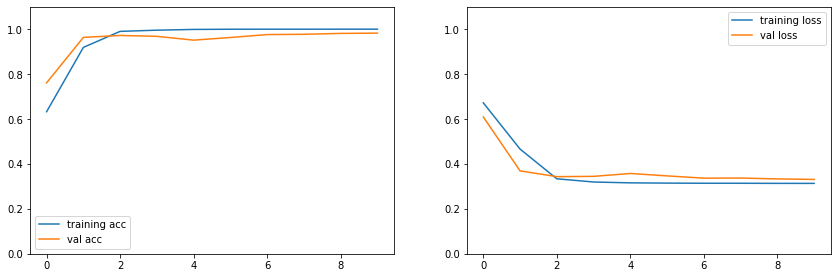

Confusion matrix, without normalization


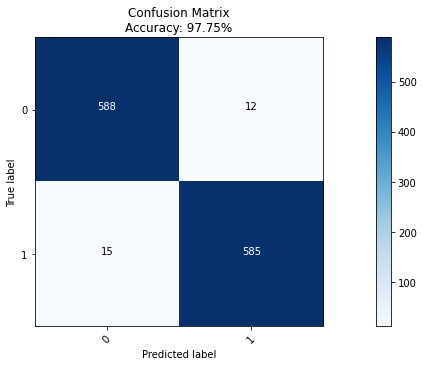

In [42]:
# most_common_1k_words_binary_ftr_vec('binary', collate_fn=True)
most_common_1k_words_binary_ftr_vec('binary', figsize=(15,5))

### Most Common 1K POS TRI and FW, TFIDF

BinaryClassifierFC(
  (fc1): Linear(in_features=1426, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=64, bias=True)
  (fc4): Linear(in_features=64, out_features=2, bias=True)
)
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 1..........


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  del sys.path[0]


Epoch #1	Train Loss: 0.693	Validation Loss: 0.693	Train Acc:0.50	Validation Acc:0.44


Epoch #2	Train Loss: 0.688	Validation Loss: 0.682	Train Acc:0.52	Validation Acc:0.50


Epoch #3	Train Loss: 0.658	Validation Loss: 0.634	Train Acc:0.73	Validation Acc:0.84


Epoch #4	Train Loss: 0.563	Validation Loss: 0.514	Train Acc:0.91	Validation Acc:0.95


Epoch #5	Train Loss: 0.441	Validation Loss: 0.398	Train Acc:0.94	Validation Acc:0.97


Epoch #6	Train Loss: 0.368	Validation Loss: 0.387	Train Acc:0.97	Validation Acc:0.93


Epoch #7	Train Loss: 0.348	Validation Loss: 0.353	Train Acc:0.98	Validation Acc:0.97


Epoch #8	Train Loss: 0.335	Validation Loss: 0.354	Train Acc:0.99	Validation Acc:0.97


Epoch #9	Train Loss: 0.326	Validation Loss: 0.351	Train Acc:1.00	Validation Acc:0.98


Epoch #10	Train Loss: 0.320	Validation Loss: 0.349	Train Acc:1.00	Validation Acc:0.98
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 2..........


Epoch #1	Train Loss: 0.692	Validation Loss: 0.688	Train Acc:0.51	Validation Acc:0.55


Epoch #2	Train Loss: 0.673	Validation Loss: 0.640	Train Acc:0.77	Validation Acc:0.95


Epoch #3	Train Loss: 0.561	Validation Loss: 0.512	Train Acc:0.94	Validation Acc:0.79


Epoch #4	Train Loss: 0.405	Validation Loss: 0.389	Train Acc:0.96	Validation Acc:0.94


Epoch #5	Train Loss: 0.348	Validation Loss: 0.369	Train Acc:0.98	Validation Acc:0.95


Epoch #6	Train Loss: 0.337	Validation Loss: 0.362	Train Acc:0.99	Validation Acc:0.94


Epoch #7	Train Loss: 0.324	Validation Loss: 0.358	Train Acc:1.00	Validation Acc:0.96


Epoch #8	Train Loss: 0.321	Validation Loss: 0.371	Train Acc:1.00	Validation Acc:0.95


Epoch #9	Train Loss: 0.317	Validation Loss: 0.345	Train Acc:1.00	Validation Acc:0.98


Epoch #10	Train Loss: 0.317	Validation Loss: 0.373	Train Acc:1.00	Validation Acc:0.95
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 3..........


Epoch #1	Train Loss: 0.691	Validation Loss: 0.681	Train Acc:0.67	Validation Acc:0.94


Epoch #2	Train Loss: 0.645	Validation Loss: 0.567	Train Acc:0.91	Validation Acc:0.89


Epoch #3	Train Loss: 0.462	Validation Loss: 0.407	Train Acc:0.96	Validation Acc:0.93


Epoch #4	Train Loss: 0.348	Validation Loss: 0.457	Train Acc:0.98	Validation Acc:0.84


Epoch #5	Train Loss: 0.345	Validation Loss: 0.372	Train Acc:0.97	Validation Acc:0.95


Epoch #6	Train Loss: 0.323	Validation Loss: 0.362	Train Acc:1.00	Validation Acc:0.95


Epoch #7	Train Loss: 0.320	Validation Loss: 0.379	Train Acc:1.00	Validation Acc:0.90


Epoch #8	Train Loss: 0.318	Validation Loss: 0.364	Train Acc:1.00	Validation Acc:0.94


Epoch #9	Train Loss: 0.316	Validation Loss: 0.374	Train Acc:1.00	Validation Acc:0.92


Epoch #10	Train Loss: 0.315	Validation Loss: 0.391	Train Acc:1.00	Validation Acc:0.93
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 4..........


Epoch #1	Train Loss: 0.693	Validation Loss: 0.694	Train Acc:0.51	Validation Acc:0.43


Epoch #2	Train Loss: 0.688	Validation Loss: 0.678	Train Acc:0.73	Validation Acc:0.73


Epoch #3	Train Loss: 0.643	Validation Loss: 0.578	Train Acc:0.89	Validation Acc:0.95


Epoch #4	Train Loss: 0.491	Validation Loss: 0.440	Train Acc:0.95	Validation Acc:0.90


Epoch #5	Train Loss: 0.377	Validation Loss: 0.374	Train Acc:0.96	Validation Acc:0.96


Epoch #6	Train Loss: 0.347	Validation Loss: 0.369	Train Acc:0.98	Validation Acc:0.93


Epoch #7	Train Loss: 0.339	Validation Loss: 0.358	Train Acc:0.98	Validation Acc:0.95


Epoch #8	Train Loss: 0.338	Validation Loss: 0.369	Train Acc:0.98	Validation Acc:0.95


Epoch #9	Train Loss: 0.327	Validation Loss: 0.350	Train Acc:0.99	Validation Acc:0.96


Epoch #10	Train Loss: 0.320	Validation Loss: 0.395	Train Acc:1.00	Validation Acc:0.91
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 5..........


Epoch #1	Train Loss: 0.693	Validation Loss: 0.697	Train Acc:0.51	Validation Acc:0.42


Epoch #2	Train Loss: 0.687	Validation Loss: 0.683	Train Acc:0.51	Validation Acc:0.48


Epoch #3	Train Loss: 0.653	Validation Loss: 0.631	Train Acc:0.56	Validation Acc:0.73


Epoch #4	Train Loss: 0.543	Validation Loss: 0.522	Train Acc:0.87	Validation Acc:0.93


Epoch #5	Train Loss: 0.410	Validation Loss: 0.379	Train Acc:0.97	Validation Acc:0.96


Epoch #6	Train Loss: 0.344	Validation Loss: 0.365	Train Acc:0.99	Validation Acc:0.96


Epoch #7	Train Loss: 0.328	Validation Loss: 0.369	Train Acc:1.00	Validation Acc:0.95


Epoch #8	Train Loss: 0.321	Validation Loss: 0.361	Train Acc:1.00	Validation Acc:0.95


Epoch #9	Train Loss: 0.319	Validation Loss: 0.364	Train Acc:1.00	Validation Acc:0.95


Epoch #10	Train Loss: 0.319	Validation Loss: 0.387	Train Acc:1.00	Validation Acc:0.92
-----------------------------------
len(train_idx) = 1000
len(test_idx) = 200

Fold 6..........


Epoch #1	Train Loss: 0.693	Validation Loss: 0.692	Train Acc:0.50	Validation Acc:0.54


Epoch #2	Train Loss: 0.690	Validation Loss: 0.684	Train Acc:0.50	Validation Acc:0.60


Epoch #3	Train Loss: 0.676	Validation Loss: 0.661	Train Acc:0.78	Validation Acc:0.95


Epoch #4	Train Loss: 0.616	Validation Loss: 0.567	Train Acc:0.94	Validation Acc:0.88


Epoch #5	Train Loss: 0.456	Validation Loss: 0.394	Train Acc:0.96	Validation Acc:0.95


Epoch #6	Train Loss: 0.363	Validation Loss: 0.386	Train Acc:0.97	Validation Acc:0.91


Epoch #7	Train Loss: 0.340	Validation Loss: 0.373	Train Acc:0.99	Validation Acc:0.96


Epoch #8	Train Loss: 0.329	Validation Loss: 0.361	Train Acc:0.99	Validation Acc:0.96


Epoch #9	Train Loss: 0.321	Validation Loss: 0.351	Train Acc:1.00	Validation Acc:0.97


Epoch #10	Train Loss: 0.317	Validation Loss: 0.351	Train Acc:1.00	Validation Acc:0.96


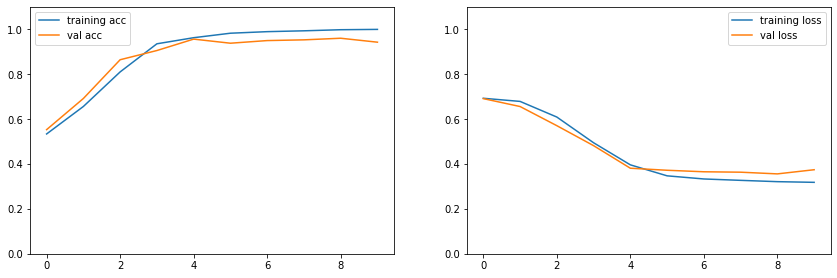

Confusion matrix, without normalization


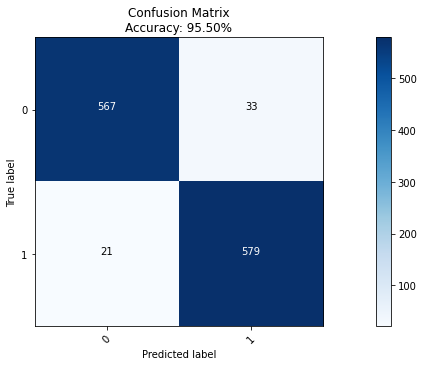

In [43]:
# most_common_1k_pos_tri_and_fw('binary', collate_fn=True)
most_common_1k_pos_tri_and_fw('binary', epochs=10, figsize=(15,5), collate_fn=True)

## Language (Country) Classification

In [30]:
# training_chunks_num, test_chunks_num = 75, 8
training_chunks_num, test_chunks_num = 100, 20

training_df_pos, test_df_pos = prepare_data(POS_CHUNKS, 'language', -1, -1, training_chunks_num, test_chunks_num)
training_df_toks, test_df_toks = prepare_data(TOKENS_CHUNKS, 'language', -1, -1, training_chunks_num, test_chunks_num)

num of countries: 22
Training size: 2200
Test size: 402
num of countries: 22
Training size: 2200
Test size: 402


### Most Common 1K words, Binary Feature Vector

LanguageClassifierLSTM(
  (rnn): LSTM(1000, 128, batch_first=True)
  (fc): Linear(in_features=128, out_features=24, bias=True)
)
-----------------------------------
len(train_idx) = 1500
len(test_idx) = 300

Fold 1..........


Epoch #1	Train Loss: 3.157	Validation Loss: 3.110	Train Acc:0.07	Validation Acc:0.10


Epoch #2	Train Loss: 2.950	Validation Loss: 2.859	Train Acc:0.30	Validation Acc:0.31


Epoch #3	Train Loss: 2.489	Validation Loss: 2.447	Train Acc:0.58	Validation Acc:0.43


Epoch #4	Train Loss: 1.918	Validation Loss: 1.988	Train Acc:0.79	Validation Acc:0.61


Epoch #5	Train Loss: 1.365	Validation Loss: 1.596	Train Acc:0.90	Validation Acc:0.70


Epoch #6	Train Loss: 0.941	Validation Loss: 1.351	Train Acc:0.96	Validation Acc:0.74


Epoch #7	Train Loss: 0.640	Validation Loss: 1.136	Train Acc:0.98	Validation Acc:0.77


Epoch #8	Train Loss: 0.456	Validation Loss: 1.001	Train Acc:0.99	Validation Acc:0.78


Epoch #9	Train Loss: 0.329	Validation Loss: 0.926	Train Acc:1.00	Validation Acc:0.81


Epoch #10	Train Loss: 0.240	Validation Loss: 0.867	Train Acc:1.00	Validation Acc:0.82


Epoch #11	Train Loss: 0.182	Validation Loss: 0.808	Train Acc:1.00	Validation Acc:0.83


Epoch #12	Train Loss: 0.142	Validation Loss: 0.781	Train Acc:1.00	Validation Acc:0.81


Epoch #13	Train Loss: 0.112	Validation Loss: 0.749	Train Acc:1.00	Validation Acc:0.83


Epoch #14	Train Loss: 0.091	Validation Loss: 0.721	Train Acc:1.00	Validation Acc:0.83


Epoch #15	Train Loss: 0.077	Validation Loss: 0.692	Train Acc:1.00	Validation Acc:0.83


Epoch #16	Train Loss: 0.066	Validation Loss: 0.697	Train Acc:1.00	Validation Acc:0.83


Epoch #17	Train Loss: 0.057	Validation Loss: 0.668	Train Acc:1.00	Validation Acc:0.85


Epoch #18	Train Loss: 0.049	Validation Loss: 0.651	Train Acc:1.00	Validation Acc:0.83


Epoch #19	Train Loss: 0.042	Validation Loss: 0.654	Train Acc:1.00	Validation Acc:0.84


Epoch #20	Train Loss: 0.037	Validation Loss: 0.643	Train Acc:1.00	Validation Acc:0.84
-----------------------------------
len(train_idx) = 1500
len(test_idx) = 300

Fold 2..........


Epoch #1	Train Loss: 3.167	Validation Loss: 3.144	Train Acc:0.06	Validation Acc:0.09


Epoch #2	Train Loss: 3.000	Validation Loss: 2.962	Train Acc:0.25	Validation Acc:0.19


Epoch #3	Train Loss: 2.627	Validation Loss: 2.571	Train Acc:0.50	Validation Acc:0.44


Epoch #4	Train Loss: 2.082	Validation Loss: 2.148	Train Acc:0.71	Validation Acc:0.54


Epoch #5	Train Loss: 1.492	Validation Loss: 1.732	Train Acc:0.86	Validation Acc:0.63


Epoch #6	Train Loss: 1.025	Validation Loss: 1.419	Train Acc:0.94	Validation Acc:0.74


Epoch #7	Train Loss: 0.687	Validation Loss: 1.185	Train Acc:0.98	Validation Acc:0.77


Epoch #8	Train Loss: 0.467	Validation Loss: 1.042	Train Acc:0.99	Validation Acc:0.80


Epoch #9	Train Loss: 0.323	Validation Loss: 0.938	Train Acc:1.00	Validation Acc:0.81


Epoch #10	Train Loss: 0.238	Validation Loss: 0.867	Train Acc:1.00	Validation Acc:0.80


Epoch #11	Train Loss: 0.178	Validation Loss: 0.818	Train Acc:1.00	Validation Acc:0.78


Epoch #12	Train Loss: 0.138	Validation Loss: 0.779	Train Acc:1.00	Validation Acc:0.81


Epoch #13	Train Loss: 0.111	Validation Loss: 0.754	Train Acc:1.00	Validation Acc:0.81


Epoch #14	Train Loss: 0.092	Validation Loss: 0.728	Train Acc:1.00	Validation Acc:0.83


Epoch #15	Train Loss: 0.077	Validation Loss: 0.708	Train Acc:1.00	Validation Acc:0.83


Epoch #16	Train Loss: 0.067	Validation Loss: 0.682	Train Acc:1.00	Validation Acc:0.83


Epoch #17	Train Loss: 0.057	Validation Loss: 0.665	Train Acc:1.00	Validation Acc:0.83


Epoch #18	Train Loss: 0.051	Validation Loss: 0.669	Train Acc:1.00	Validation Acc:0.82


Epoch #19	Train Loss: 0.045	Validation Loss: 0.650	Train Acc:1.00	Validation Acc:0.83


Epoch #20	Train Loss: 0.040	Validation Loss: 0.648	Train Acc:1.00	Validation Acc:0.84
-----------------------------------
len(train_idx) = 1500
len(test_idx) = 300

Fold 3..........


Epoch #1	Train Loss: 3.158	Validation Loss: 3.121	Train Acc:0.08	Validation Acc:0.09


Epoch #2	Train Loss: 2.955	Validation Loss: 2.891	Train Acc:0.25	Validation Acc:0.26


Epoch #3	Train Loss: 2.520	Validation Loss: 2.457	Train Acc:0.56	Validation Acc:0.39


Epoch #4	Train Loss: 1.908	Validation Loss: 1.969	Train Acc:0.80	Validation Acc:0.59


Epoch #5	Train Loss: 1.310	Validation Loss: 1.537	Train Acc:0.91	Validation Acc:0.71


Epoch #6	Train Loss: 0.838	Validation Loss: 1.230	Train Acc:0.97	Validation Acc:0.76


Epoch #7	Train Loss: 0.548	Validation Loss: 1.080	Train Acc:0.98	Validation Acc:0.76


Epoch #8	Train Loss: 0.367	Validation Loss: 0.939	Train Acc:0.99	Validation Acc:0.82


Epoch #9	Train Loss: 0.256	Validation Loss: 0.866	Train Acc:1.00	Validation Acc:0.81


Epoch #10	Train Loss: 0.190	Validation Loss: 0.795	Train Acc:1.00	Validation Acc:0.84


Epoch #11	Train Loss: 0.144	Validation Loss: 0.761	Train Acc:1.00	Validation Acc:0.82


Epoch #12	Train Loss: 0.113	Validation Loss: 0.745	Train Acc:1.00	Validation Acc:0.84


Epoch #13	Train Loss: 0.092	Validation Loss: 0.710	Train Acc:1.00	Validation Acc:0.83


Epoch #14	Train Loss: 0.077	Validation Loss: 0.719	Train Acc:1.00	Validation Acc:0.82


Epoch #15	Train Loss: 0.066	Validation Loss: 0.661	Train Acc:1.00	Validation Acc:0.82


Epoch #16	Train Loss: 0.058	Validation Loss: 0.660	Train Acc:1.00	Validation Acc:0.81


Epoch #17	Train Loss: 0.051	Validation Loss: 0.662	Train Acc:1.00	Validation Acc:0.83


Epoch #18	Train Loss: 0.045	Validation Loss: 0.644	Train Acc:1.00	Validation Acc:0.84


Epoch #19	Train Loss: 0.041	Validation Loss: 0.651	Train Acc:1.00	Validation Acc:0.82


Epoch #20	Train Loss: 0.038	Validation Loss: 0.627	Train Acc:1.00	Validation Acc:0.81
-----------------------------------
len(train_idx) = 1500
len(test_idx) = 300

Fold 4..........


Epoch #1	Train Loss: 3.155	Validation Loss: 3.116	Train Acc:0.06	Validation Acc:0.08


Epoch #2	Train Loss: 2.941	Validation Loss: 2.836	Train Acc:0.26	Validation Acc:0.27


Epoch #3	Train Loss: 2.450	Validation Loss: 2.344	Train Acc:0.57	Validation Acc:0.50


Epoch #4	Train Loss: 1.802	Validation Loss: 1.834	Train Acc:0.81	Validation Acc:0.66


Epoch #5	Train Loss: 1.222	Validation Loss: 1.449	Train Acc:0.93	Validation Acc:0.72


Epoch #6	Train Loss: 0.773	Validation Loss: 1.171	Train Acc:0.97	Validation Acc:0.77


Epoch #7	Train Loss: 0.498	Validation Loss: 1.017	Train Acc:0.99	Validation Acc:0.79


Epoch #8	Train Loss: 0.332	Validation Loss: 0.913	Train Acc:1.00	Validation Acc:0.80


Epoch #9	Train Loss: 0.232	Validation Loss: 0.807	Train Acc:1.00	Validation Acc:0.81


Epoch #10	Train Loss: 0.164	Validation Loss: 0.779	Train Acc:1.00	Validation Acc:0.81


Epoch #11	Train Loss: 0.127	Validation Loss: 0.734	Train Acc:1.00	Validation Acc:0.82


Epoch #12	Train Loss: 0.102	Validation Loss: 0.726	Train Acc:1.00	Validation Acc:0.80


Epoch #13	Train Loss: 0.083	Validation Loss: 0.673	Train Acc:1.00	Validation Acc:0.84


Epoch #14	Train Loss: 0.072	Validation Loss: 0.671	Train Acc:1.00	Validation Acc:0.84


Epoch #15	Train Loss: 0.059	Validation Loss: 0.666	Train Acc:1.00	Validation Acc:0.81


Epoch #16	Train Loss: 0.052	Validation Loss: 0.659	Train Acc:1.00	Validation Acc:0.83


Epoch #17	Train Loss: 0.045	Validation Loss: 0.640	Train Acc:1.00	Validation Acc:0.83


Epoch #18	Train Loss: 0.040	Validation Loss: 0.644	Train Acc:1.00	Validation Acc:0.81


Epoch #19	Train Loss: 0.037	Validation Loss: 0.645	Train Acc:1.00	Validation Acc:0.81


Epoch #20	Train Loss: 0.033	Validation Loss: 0.633	Train Acc:1.00	Validation Acc:0.82
-----------------------------------
len(train_idx) = 1500
len(test_idx) = 300

Fold 5..........


Epoch #1	Train Loss: 3.166	Validation Loss: 3.116	Train Acc:0.06	Validation Acc:0.14


Epoch #2	Train Loss: 2.983	Validation Loss: 2.919	Train Acc:0.25	Validation Acc:0.30


Epoch #3	Train Loss: 2.543	Validation Loss: 2.496	Train Acc:0.55	Validation Acc:0.41


Epoch #4	Train Loss: 1.896	Validation Loss: 2.014	Train Acc:0.78	Validation Acc:0.55


Epoch #5	Train Loss: 1.269	Validation Loss: 1.575	Train Acc:0.89	Validation Acc:0.69


Epoch #6	Train Loss: 0.791	Validation Loss: 1.283	Train Acc:0.96	Validation Acc:0.74


Epoch #7	Train Loss: 0.509	Validation Loss: 1.082	Train Acc:0.99	Validation Acc:0.76


Epoch #8	Train Loss: 0.318	Validation Loss: 0.971	Train Acc:1.00	Validation Acc:0.78


Epoch #9	Train Loss: 0.221	Validation Loss: 0.879	Train Acc:1.00	Validation Acc:0.80


Epoch #10	Train Loss: 0.159	Validation Loss: 0.826	Train Acc:1.00	Validation Acc:0.80


Epoch #11	Train Loss: 0.123	Validation Loss: 0.806	Train Acc:1.00	Validation Acc:0.79


Epoch #12	Train Loss: 0.096	Validation Loss: 0.768	Train Acc:1.00	Validation Acc:0.80


Epoch #13	Train Loss: 0.078	Validation Loss: 0.732	Train Acc:1.00	Validation Acc:0.83


Epoch #14	Train Loss: 0.067	Validation Loss: 0.743	Train Acc:1.00	Validation Acc:0.79


Epoch #15	Train Loss: 0.057	Validation Loss: 0.718	Train Acc:1.00	Validation Acc:0.82


Epoch #16	Train Loss: 0.050	Validation Loss: 0.707	Train Acc:1.00	Validation Acc:0.80


Epoch #17	Train Loss: 0.045	Validation Loss: 0.703	Train Acc:1.00	Validation Acc:0.79


Epoch #18	Train Loss: 0.039	Validation Loss: 0.695	Train Acc:1.00	Validation Acc:0.81


Epoch #19	Train Loss: 0.036	Validation Loss: 0.680	Train Acc:1.00	Validation Acc:0.81


Epoch #20	Train Loss: 0.032	Validation Loss: 0.677	Train Acc:1.00	Validation Acc:0.81
-----------------------------------
len(train_idx) = 1500
len(test_idx) = 300

Fold 6..........


Epoch #1	Train Loss: 3.162	Validation Loss: 3.135	Train Acc:0.07	Validation Acc:0.05


Epoch #2	Train Loss: 2.969	Validation Loss: 2.892	Train Acc:0.25	Validation Acc:0.23


Epoch #3	Train Loss: 2.502	Validation Loss: 2.446	Train Acc:0.58	Validation Acc:0.41


Epoch #4	Train Loss: 1.822	Validation Loss: 1.904	Train Acc:0.83	Validation Acc:0.56


Epoch #5	Train Loss: 1.154	Validation Loss: 1.452	Train Acc:0.94	Validation Acc:0.73


Epoch #6	Train Loss: 0.702	Validation Loss: 1.155	Train Acc:0.98	Validation Acc:0.79


Epoch #7	Train Loss: 0.437	Validation Loss: 1.013	Train Acc:0.99	Validation Acc:0.78


Epoch #8	Train Loss: 0.283	Validation Loss: 0.933	Train Acc:1.00	Validation Acc:0.78


Epoch #9	Train Loss: 0.198	Validation Loss: 0.838	Train Acc:1.00	Validation Acc:0.79


Epoch #10	Train Loss: 0.147	Validation Loss: 0.780	Train Acc:1.00	Validation Acc:0.83


Epoch #11	Train Loss: 0.111	Validation Loss: 0.730	Train Acc:1.00	Validation Acc:0.82


Epoch #12	Train Loss: 0.088	Validation Loss: 0.710	Train Acc:1.00	Validation Acc:0.84


Epoch #13	Train Loss: 0.073	Validation Loss: 0.687	Train Acc:1.00	Validation Acc:0.83


Epoch #14	Train Loss: 0.061	Validation Loss: 0.670	Train Acc:1.00	Validation Acc:0.85


Epoch #15	Train Loss: 0.053	Validation Loss: 0.655	Train Acc:1.00	Validation Acc:0.85


Epoch #16	Train Loss: 0.046	Validation Loss: 0.640	Train Acc:1.00	Validation Acc:0.84


Epoch #17	Train Loss: 0.040	Validation Loss: 0.625	Train Acc:1.00	Validation Acc:0.84


Epoch #18	Train Loss: 0.037	Validation Loss: 0.643	Train Acc:1.00	Validation Acc:0.82


Epoch #19	Train Loss: 0.033	Validation Loss: 0.628	Train Acc:1.00	Validation Acc:0.85


Epoch #20	Train Loss: 0.030	Validation Loss: 0.630	Train Acc:1.00	Validation Acc:0.84


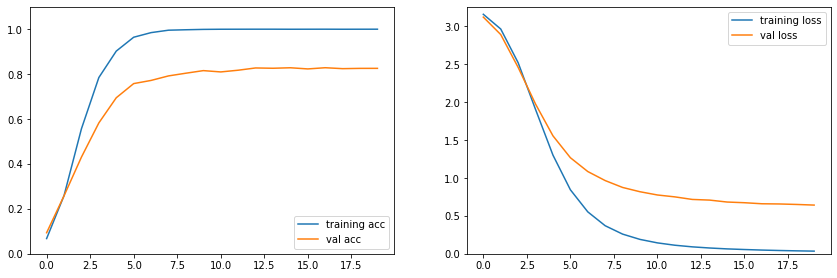

Confusion matrix, without normalization


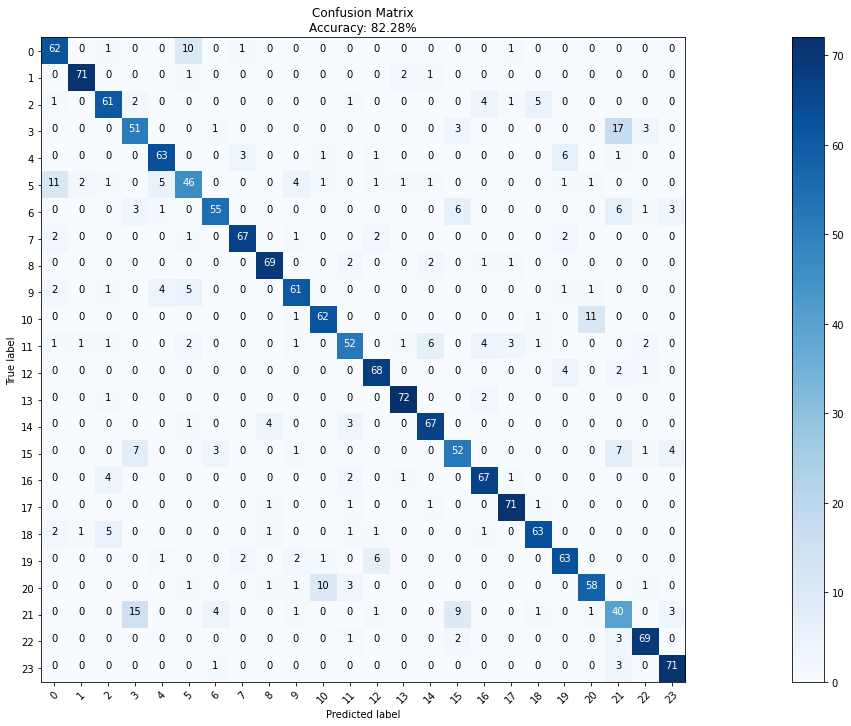

In [29]:
most_common_1k_words_binary_ftr_vec('language', lr=0.001, epochs=15, num_classes=training_df_toks[LABEL].nunique(), classifier='lstm', collate_fn=True)

### Most Common 1K POS TRI and FW, TFIDF

LanguageClassifierLSTM(
  (rnn): LSTM(1426, 128, batch_first=True)
  (fc): Linear(in_features=128, out_features=22, bias=True)
)
len(train_idx) = 1834
len(test_idx) = 366

Fold 1..........


Epoch #1	Train Loss: 3.094	Validation Loss: 3.093	Train Acc:0.04	Validation Acc:0.06


Epoch #2	Train Loss: 3.089	Validation Loss: 3.090	Train Acc:0.05	Validation Acc:0.05


Epoch #3	Train Loss: 3.085	Validation Loss: 3.087	Train Acc:0.06	Validation Acc:0.05


Epoch #4	Train Loss: 3.077	Validation Loss: 3.090	Train Acc:0.06	Validation Acc:0.05


Epoch #5	Train Loss: 3.071	Validation Loss: 3.082	Train Acc:0.06	Validation Acc:0.05


Epoch #6	Train Loss: 3.064	Validation Loss: 3.064	Train Acc:0.08	Validation Acc:0.09


Epoch #7	Train Loss: 3.050	Validation Loss: 3.069	Train Acc:0.10	Validation Acc:0.07


Epoch #8	Train Loss: 3.032	Validation Loss: 3.052	Train Acc:0.09	Validation Acc:0.10


Epoch #9	Train Loss: 2.994	Validation Loss: 3.015	Train Acc:0.14	Validation Acc:0.11


Epoch #10	Train Loss: 2.955	Validation Loss: 2.955	Train Acc:0.13	Validation Acc:0.13


Epoch #11	Train Loss: 2.896	Validation Loss: 2.949	Train Acc:0.18	Validation Acc:0.09


Epoch #12	Train Loss: 2.808	Validation Loss: 2.816	Train Acc:0.21	Validation Acc:0.19


Epoch #13	Train Loss: 2.706	Validation Loss: 2.747	Train Acc:0.23	Validation Acc:0.19


Epoch #14	Train Loss: 2.576	Validation Loss: 2.647	Train Acc:0.29	Validation Acc:0.18


Epoch #15	Train Loss: 2.458	Validation Loss: 2.543	Train Acc:0.34	Validation Acc:0.23


Epoch #16	Train Loss: 2.328	Validation Loss: 2.436	Train Acc:0.38	Validation Acc:0.29


Epoch #17	Train Loss: 2.206	Validation Loss: 2.343	Train Acc:0.44	Validation Acc:0.31


Epoch #18	Train Loss: 2.082	Validation Loss: 2.239	Train Acc:0.49	Validation Acc:0.34


Epoch #19	Train Loss: 1.958	Validation Loss: 2.173	Train Acc:0.54	Validation Acc:0.38


Epoch #20	Train Loss: 1.822	Validation Loss: 2.063	Train Acc:0.59	Validation Acc:0.39


Epoch #21	Train Loss: 1.701	Validation Loss: 1.967	Train Acc:0.65	Validation Acc:0.47


Epoch #22	Train Loss: 1.579	Validation Loss: 1.924	Train Acc:0.68	Validation Acc:0.43


Epoch #23	Train Loss: 1.457	Validation Loss: 1.808	Train Acc:0.71	Validation Acc:0.51


Epoch #24	Train Loss: 1.338	Validation Loss: 1.755	Train Acc:0.77	Validation Acc:0.49


Epoch #25	Train Loss: 1.231	Validation Loss: 1.700	Train Acc:0.80	Validation Acc:0.53


Epoch #26	Train Loss: 1.127	Validation Loss: 1.637	Train Acc:0.82	Validation Acc:0.55


Epoch #27	Train Loss: 1.032	Validation Loss: 1.510	Train Acc:0.86	Validation Acc:0.62


Epoch #28	Train Loss: 0.935	Validation Loss: 1.513	Train Acc:0.88	Validation Acc:0.57


Epoch #29	Train Loss: 0.870	Validation Loss: 1.477	Train Acc:0.89	Validation Acc:0.58


Epoch #30	Train Loss: 0.797	Validation Loss: 1.431	Train Acc:0.90	Validation Acc:0.58


Epoch #31	Train Loss: 0.723	Validation Loss: 1.309	Train Acc:0.92	Validation Acc:0.68


Epoch #32	Train Loss: 0.666	Validation Loss: 1.316	Train Acc:0.93	Validation Acc:0.63


Epoch #33	Train Loss: 0.600	Validation Loss: 1.281	Train Acc:0.95	Validation Acc:0.64


Epoch #34	Train Loss: 0.557	Validation Loss: 1.287	Train Acc:0.95	Validation Acc:0.62


Epoch #35	Train Loss: 0.515	Validation Loss: 1.224	Train Acc:0.95	Validation Acc:0.65


Epoch #36	Train Loss: 0.473	Validation Loss: 1.193	Train Acc:0.95	Validation Acc:0.66


Epoch #37	Train Loss: 0.431	Validation Loss: 1.190	Train Acc:0.97	Validation Acc:0.64


Epoch #38	Train Loss: 0.393	Validation Loss: 1.139	Train Acc:0.97	Validation Acc:0.69


Epoch #39	Train Loss: 0.364	Validation Loss: 1.132	Train Acc:0.98	Validation Acc:0.68


Epoch #40	Train Loss: 0.336	Validation Loss: 1.160	Train Acc:0.98	Validation Acc:0.64


Epoch #41	Train Loss: 0.309	Validation Loss: 1.099	Train Acc:0.98	Validation Acc:0.69


Epoch #42	Train Loss: 0.286	Validation Loss: 1.127	Train Acc:0.99	Validation Acc:0.65


Epoch #43	Train Loss: 0.267	Validation Loss: 1.067	Train Acc:0.99	Validation Acc:0.68


Epoch #44	Train Loss: 0.241	Validation Loss: 1.053	Train Acc:0.99	Validation Acc:0.69


Epoch #45	Train Loss: 0.226	Validation Loss: 1.036	Train Acc:0.99	Validation Acc:0.71


Epoch #46	Train Loss: 0.205	Validation Loss: 1.016	Train Acc:1.00	Validation Acc:0.70


Epoch #47	Train Loss: 0.198	Validation Loss: 1.010	Train Acc:0.99	Validation Acc:0.69


Epoch #48	Train Loss: 0.186	Validation Loss: 0.963	Train Acc:1.00	Validation Acc:0.71


Epoch #49	Train Loss: 0.166	Validation Loss: 0.966	Train Acc:1.00	Validation Acc:0.71


Epoch #50	Train Loss: 0.157	Validation Loss: 0.976	Train Acc:1.00	Validation Acc:0.71


Epoch #51	Train Loss: 0.145	Validation Loss: 0.967	Train Acc:1.00	Validation Acc:0.72


Epoch #52	Train Loss: 0.140	Validation Loss: 0.945	Train Acc:1.00	Validation Acc:0.70


Epoch #53	Train Loss: 0.127	Validation Loss: 0.950	Train Acc:1.00	Validation Acc:0.72


Epoch #54	Train Loss: 0.120	Validation Loss: 0.925	Train Acc:1.00	Validation Acc:0.71


Epoch #55	Train Loss: 0.109	Validation Loss: 0.919	Train Acc:1.00	Validation Acc:0.71


Epoch #56	Train Loss: 0.105	Validation Loss: 0.933	Train Acc:1.00	Validation Acc:0.71


Epoch #57	Train Loss: 0.097	Validation Loss: 0.929	Train Acc:1.00	Validation Acc:0.70


Epoch #58	Train Loss: 0.092	Validation Loss: 0.942	Train Acc:1.00	Validation Acc:0.71


Epoch #59	Train Loss: 0.088	Validation Loss: 0.895	Train Acc:1.00	Validation Acc:0.74


Epoch #60	Train Loss: 0.081	Validation Loss: 0.911	Train Acc:1.00	Validation Acc:0.72
len(train_idx) = 1834
len(test_idx) = 366

Fold 2..........


Epoch #1	Train Loss: 3.094	Validation Loss: 3.092	Train Acc:0.04	Validation Acc:0.04


Epoch #2	Train Loss: 3.093	Validation Loss: 3.093	Train Acc:0.05	Validation Acc:0.04


Epoch #3	Train Loss: 3.090	Validation Loss: 3.096	Train Acc:0.05	Validation Acc:0.04


Epoch #4	Train Loss: 3.089	Validation Loss: 3.097	Train Acc:0.04	Validation Acc:0.03


Epoch #5	Train Loss: 3.088	Validation Loss: 3.092	Train Acc:0.05	Validation Acc:0.04


Epoch #6	Train Loss: 3.084	Validation Loss: 3.089	Train Acc:0.06	Validation Acc:0.06


Epoch #7	Train Loss: 3.083	Validation Loss: 3.083	Train Acc:0.06	Validation Acc:0.08


Epoch #8	Train Loss: 3.085	Validation Loss: 3.087	Train Acc:0.07	Validation Acc:0.05


Epoch #9	Train Loss: 3.079	Validation Loss: 3.081	Train Acc:0.08	Validation Acc:0.07


Epoch #10	Train Loss: 3.075	Validation Loss: 3.086	Train Acc:0.08	Validation Acc:0.07


Epoch #11	Train Loss: 3.072	Validation Loss: 3.084	Train Acc:0.07	Validation Acc:0.06


Epoch #12	Train Loss: 3.064	Validation Loss: 3.077	Train Acc:0.07	Validation Acc:0.05


Epoch #13	Train Loss: 3.054	Validation Loss: 3.054	Train Acc:0.07	Validation Acc:0.07


Epoch #14	Train Loss: 3.044	Validation Loss: 3.063	Train Acc:0.10	Validation Acc:0.07


Epoch #15	Train Loss: 3.030	Validation Loss: 3.041	Train Acc:0.09	Validation Acc:0.06


Epoch #16	Train Loss: 3.005	Validation Loss: 3.012	Train Acc:0.10	Validation Acc:0.09


Epoch #17	Train Loss: 2.976	Validation Loss: 2.983	Train Acc:0.12	Validation Acc:0.09


Epoch #18	Train Loss: 2.942	Validation Loss: 2.967	Train Acc:0.13	Validation Acc:0.09


Epoch #19	Train Loss: 2.905	Validation Loss: 2.903	Train Acc:0.13	Validation Acc:0.13


Epoch #20	Train Loss: 2.860	Validation Loss: 2.872	Train Acc:0.15	Validation Acc:0.14


Epoch #21	Train Loss: 2.795	Validation Loss: 2.818	Train Acc:0.18	Validation Acc:0.12


Epoch #22	Train Loss: 2.736	Validation Loss: 2.783	Train Acc:0.19	Validation Acc:0.16


Epoch #23	Train Loss: 2.670	Validation Loss: 2.708	Train Acc:0.22	Validation Acc:0.16


Epoch #24	Train Loss: 2.620	Validation Loss: 2.661	Train Acc:0.21	Validation Acc:0.16


Epoch #25	Train Loss: 2.567	Validation Loss: 2.619	Train Acc:0.24	Validation Acc:0.20


Epoch #26	Train Loss: 2.484	Validation Loss: 2.547	Train Acc:0.29	Validation Acc:0.22


Epoch #27	Train Loss: 2.438	Validation Loss: 2.511	Train Acc:0.29	Validation Acc:0.22


Epoch #28	Train Loss: 2.359	Validation Loss: 2.488	Train Acc:0.35	Validation Acc:0.21


Epoch #29	Train Loss: 2.304	Validation Loss: 2.431	Train Acc:0.35	Validation Acc:0.25


Epoch #30	Train Loss: 2.229	Validation Loss: 2.341	Train Acc:0.41	Validation Acc:0.31


Epoch #31	Train Loss: 2.156	Validation Loss: 2.300	Train Acc:0.45	Validation Acc:0.33


Epoch #32	Train Loss: 2.075	Validation Loss: 2.254	Train Acc:0.48	Validation Acc:0.35


Epoch #33	Train Loss: 1.992	Validation Loss: 2.178	Train Acc:0.50	Validation Acc:0.37


Epoch #34	Train Loss: 1.907	Validation Loss: 2.103	Train Acc:0.54	Validation Acc:0.41


Epoch #35	Train Loss: 1.829	Validation Loss: 2.089	Train Acc:0.58	Validation Acc:0.36


Epoch #36	Train Loss: 1.735	Validation Loss: 2.016	Train Acc:0.63	Validation Acc:0.40


Epoch #37	Train Loss: 1.643	Validation Loss: 1.978	Train Acc:0.67	Validation Acc:0.40


Epoch #38	Train Loss: 1.560	Validation Loss: 1.900	Train Acc:0.69	Validation Acc:0.42


Epoch #39	Train Loss: 1.466	Validation Loss: 1.879	Train Acc:0.73	Validation Acc:0.41


Epoch #40	Train Loss: 1.385	Validation Loss: 1.804	Train Acc:0.74	Validation Acc:0.47


Epoch #41	Train Loss: 1.296	Validation Loss: 1.754	Train Acc:0.78	Validation Acc:0.47


Epoch #42	Train Loss: 1.236	Validation Loss: 1.729	Train Acc:0.80	Validation Acc:0.52


Epoch #43	Train Loss: 1.138	Validation Loss: 1.638	Train Acc:0.82	Validation Acc:0.50


Epoch #44	Train Loss: 1.066	Validation Loss: 1.568	Train Acc:0.83	Validation Acc:0.56


Epoch #45	Train Loss: 0.996	Validation Loss: 1.587	Train Acc:0.85	Validation Acc:0.53


Epoch #46	Train Loss: 0.932	Validation Loss: 1.559	Train Acc:0.88	Validation Acc:0.54


Epoch #47	Train Loss: 0.872	Validation Loss: 1.484	Train Acc:0.88	Validation Acc:0.59


Epoch #48	Train Loss: 0.810	Validation Loss: 1.447	Train Acc:0.91	Validation Acc:0.57


Epoch #49	Train Loss: 0.752	Validation Loss: 1.403	Train Acc:0.91	Validation Acc:0.58


Epoch #50	Train Loss: 0.697	Validation Loss: 1.384	Train Acc:0.92	Validation Acc:0.60


Epoch #51	Train Loss: 0.661	Validation Loss: 1.389	Train Acc:0.93	Validation Acc:0.57


Epoch #52	Train Loss: 0.604	Validation Loss: 1.330	Train Acc:0.94	Validation Acc:0.61


Epoch #53	Train Loss: 0.558	Validation Loss: 1.314	Train Acc:0.95	Validation Acc:0.61


Epoch #54	Train Loss: 0.517	Validation Loss: 1.323	Train Acc:0.96	Validation Acc:0.58


Epoch #55	Train Loss: 0.492	Validation Loss: 1.295	Train Acc:0.96	Validation Acc:0.59


Epoch #56	Train Loss: 0.462	Validation Loss: 1.297	Train Acc:0.96	Validation Acc:0.59


Epoch #57	Train Loss: 0.427	Validation Loss: 1.283	Train Acc:0.98	Validation Acc:0.62


Epoch #58	Train Loss: 0.396	Validation Loss: 1.228	Train Acc:0.98	Validation Acc:0.60


Epoch #59	Train Loss: 0.366	Validation Loss: 1.216	Train Acc:0.98	Validation Acc:0.62


Epoch #60	Train Loss: 0.350	Validation Loss: 1.150	Train Acc:0.98	Validation Acc:0.64
len(train_idx) = 1834
len(test_idx) = 366

Fold 3..........


Epoch #1	Train Loss: 3.092	Validation Loss: 3.093	Train Acc:0.06	Validation Acc:0.04


Epoch #2	Train Loss: 3.095	Validation Loss: 3.090	Train Acc:0.05	Validation Acc:0.03


Epoch #3	Train Loss: 3.092	Validation Loss: 3.095	Train Acc:0.03	Validation Acc:0.05


Epoch #4	Train Loss: 3.089	Validation Loss: 3.088	Train Acc:0.06	Validation Acc:0.06


Epoch #5	Train Loss: 3.090	Validation Loss: 3.091	Train Acc:0.06	Validation Acc:0.04


Epoch #6	Train Loss: 3.087	Validation Loss: 3.092	Train Acc:0.06	Validation Acc:0.06


Epoch #7	Train Loss: 3.086	Validation Loss: 3.099	Train Acc:0.06	Validation Acc:0.04


Epoch #8	Train Loss: 3.080	Validation Loss: 3.085	Train Acc:0.06	Validation Acc:0.05


Epoch #9	Train Loss: 3.080	Validation Loss: 3.091	Train Acc:0.06	Validation Acc:0.07


Epoch #10	Train Loss: 3.079	Validation Loss: 3.084	Train Acc:0.07	Validation Acc:0.06


Epoch #11	Train Loss: 3.073	Validation Loss: 3.086	Train Acc:0.07	Validation Acc:0.05


Epoch #12	Train Loss: 3.067	Validation Loss: 3.082	Train Acc:0.06	Validation Acc:0.06


Epoch #13	Train Loss: 3.058	Validation Loss: 3.064	Train Acc:0.08	Validation Acc:0.08


Epoch #14	Train Loss: 3.045	Validation Loss: 3.071	Train Acc:0.10	Validation Acc:0.05


Epoch #15	Train Loss: 3.027	Validation Loss: 3.054	Train Acc:0.10	Validation Acc:0.07


Epoch #16	Train Loss: 3.003	Validation Loss: 3.031	Train Acc:0.12	Validation Acc:0.07


Epoch #17	Train Loss: 2.970	Validation Loss: 2.985	Train Acc:0.14	Validation Acc:0.12


Epoch #18	Train Loss: 2.923	Validation Loss: 2.928	Train Acc:0.17	Validation Acc:0.13


Epoch #19	Train Loss: 2.869	Validation Loss: 2.886	Train Acc:0.18	Validation Acc:0.12


Epoch #20	Train Loss: 2.800	Validation Loss: 2.846	Train Acc:0.20	Validation Acc:0.15


Epoch #21	Train Loss: 2.736	Validation Loss: 2.775	Train Acc:0.22	Validation Acc:0.11


Epoch #22	Train Loss: 2.652	Validation Loss: 2.721	Train Acc:0.25	Validation Acc:0.14


Epoch #23	Train Loss: 2.561	Validation Loss: 2.640	Train Acc:0.28	Validation Acc:0.23


Epoch #24	Train Loss: 2.476	Validation Loss: 2.560	Train Acc:0.33	Validation Acc:0.23


Epoch #25	Train Loss: 2.398	Validation Loss: 2.499	Train Acc:0.35	Validation Acc:0.24


Epoch #26	Train Loss: 2.319	Validation Loss: 2.426	Train Acc:0.39	Validation Acc:0.28


Epoch #27	Train Loss: 2.234	Validation Loss: 2.347	Train Acc:0.42	Validation Acc:0.29


Epoch #28	Train Loss: 2.142	Validation Loss: 2.299	Train Acc:0.46	Validation Acc:0.33


Epoch #29	Train Loss: 2.057	Validation Loss: 2.262	Train Acc:0.50	Validation Acc:0.30


Epoch #30	Train Loss: 1.962	Validation Loss: 2.164	Train Acc:0.53	Validation Acc:0.35


Epoch #31	Train Loss: 1.885	Validation Loss: 2.116	Train Acc:0.57	Validation Acc:0.35


Epoch #32	Train Loss: 1.787	Validation Loss: 2.060	Train Acc:0.60	Validation Acc:0.42


Epoch #33	Train Loss: 1.704	Validation Loss: 2.025	Train Acc:0.63	Validation Acc:0.37


Epoch #34	Train Loss: 1.636	Validation Loss: 1.949	Train Acc:0.66	Validation Acc:0.42


Epoch #35	Train Loss: 1.549	Validation Loss: 1.898	Train Acc:0.69	Validation Acc:0.48


Epoch #36	Train Loss: 1.454	Validation Loss: 1.848	Train Acc:0.74	Validation Acc:0.45


Epoch #37	Train Loss: 1.388	Validation Loss: 1.821	Train Acc:0.75	Validation Acc:0.47


Epoch #38	Train Loss: 1.295	Validation Loss: 1.745	Train Acc:0.76	Validation Acc:0.51


Epoch #39	Train Loss: 1.213	Validation Loss: 1.715	Train Acc:0.81	Validation Acc:0.48


Epoch #40	Train Loss: 1.150	Validation Loss: 1.641	Train Acc:0.83	Validation Acc:0.54


Epoch #41	Train Loss: 1.090	Validation Loss: 1.648	Train Acc:0.82	Validation Acc:0.53


Epoch #42	Train Loss: 1.011	Validation Loss: 1.575	Train Acc:0.87	Validation Acc:0.53


Epoch #43	Train Loss: 0.959	Validation Loss: 1.506	Train Acc:0.87	Validation Acc:0.60


Epoch #44	Train Loss: 0.887	Validation Loss: 1.510	Train Acc:0.89	Validation Acc:0.57


Epoch #45	Train Loss: 0.833	Validation Loss: 1.448	Train Acc:0.90	Validation Acc:0.55


Epoch #46	Train Loss: 0.781	Validation Loss: 1.421	Train Acc:0.91	Validation Acc:0.59


Epoch #47	Train Loss: 0.725	Validation Loss: 1.408	Train Acc:0.93	Validation Acc:0.58


Epoch #48	Train Loss: 0.674	Validation Loss: 1.363	Train Acc:0.93	Validation Acc:0.60


Epoch #49	Train Loss: 0.630	Validation Loss: 1.347	Train Acc:0.94	Validation Acc:0.60


Epoch #50	Train Loss: 0.588	Validation Loss: 1.310	Train Acc:0.95	Validation Acc:0.62


Epoch #51	Train Loss: 0.548	Validation Loss: 1.289	Train Acc:0.96	Validation Acc:0.61


Epoch #52	Train Loss: 0.520	Validation Loss: 1.251	Train Acc:0.95	Validation Acc:0.63


Epoch #53	Train Loss: 0.486	Validation Loss: 1.238	Train Acc:0.97	Validation Acc:0.67


Epoch #54	Train Loss: 0.449	Validation Loss: 1.214	Train Acc:0.97	Validation Acc:0.64


Epoch #55	Train Loss: 0.416	Validation Loss: 1.204	Train Acc:0.98	Validation Acc:0.63


Epoch #56	Train Loss: 0.385	Validation Loss: 1.187	Train Acc:0.98	Validation Acc:0.63


Epoch #57	Train Loss: 0.369	Validation Loss: 1.164	Train Acc:0.98	Validation Acc:0.65


Epoch #58	Train Loss: 0.348	Validation Loss: 1.158	Train Acc:0.98	Validation Acc:0.66


Epoch #59	Train Loss: 0.318	Validation Loss: 1.134	Train Acc:0.99	Validation Acc:0.67


Epoch #60	Train Loss: 0.301	Validation Loss: 1.117	Train Acc:0.99	Validation Acc:0.67
len(train_idx) = 1834
len(test_idx) = 366

Fold 4..........


Epoch #1	Train Loss: 3.094	Validation Loss: 3.101	Train Acc:0.05	Validation Acc:0.03


Epoch #2	Train Loss: 3.091	Validation Loss: 3.090	Train Acc:0.05	Validation Acc:0.04


Epoch #3	Train Loss: 3.093	Validation Loss: 3.094	Train Acc:0.04	Validation Acc:0.05


Epoch #4	Train Loss: 3.091	Validation Loss: 3.093	Train Acc:0.05	Validation Acc:0.04


Epoch #5	Train Loss: 3.089	Validation Loss: 3.096	Train Acc:0.05	Validation Acc:0.06


Epoch #6	Train Loss: 3.088	Validation Loss: 3.097	Train Acc:0.05	Validation Acc:0.06


Epoch #7	Train Loss: 3.086	Validation Loss: 3.090	Train Acc:0.06	Validation Acc:0.05


Epoch #8	Train Loss: 3.086	Validation Loss: 3.092	Train Acc:0.06	Validation Acc:0.05


Epoch #9	Train Loss: 3.081	Validation Loss: 3.090	Train Acc:0.06	Validation Acc:0.05


Epoch #10	Train Loss: 3.079	Validation Loss: 3.096	Train Acc:0.06	Validation Acc:0.04


Epoch #11	Train Loss: 3.078	Validation Loss: 3.095	Train Acc:0.06	Validation Acc:0.06


Epoch #12	Train Loss: 3.075	Validation Loss: 3.077	Train Acc:0.06	Validation Acc:0.07


Epoch #13	Train Loss: 3.066	Validation Loss: 3.089	Train Acc:0.08	Validation Acc:0.04


Epoch #14	Train Loss: 3.062	Validation Loss: 3.077	Train Acc:0.09	Validation Acc:0.06


Epoch #15	Train Loss: 3.053	Validation Loss: 3.071	Train Acc:0.09	Validation Acc:0.06


Epoch #16	Train Loss: 3.028	Validation Loss: 3.049	Train Acc:0.10	Validation Acc:0.07


Epoch #17	Train Loss: 3.007	Validation Loss: 3.041	Train Acc:0.11	Validation Acc:0.08


Epoch #18	Train Loss: 2.971	Validation Loss: 2.986	Train Acc:0.12	Validation Acc:0.10


Epoch #19	Train Loss: 2.928	Validation Loss: 2.963	Train Acc:0.14	Validation Acc:0.10


Epoch #20	Train Loss: 2.880	Validation Loss: 2.904	Train Acc:0.15	Validation Acc:0.12


Epoch #21	Train Loss: 2.811	Validation Loss: 2.826	Train Acc:0.16	Validation Acc:0.14


Epoch #22	Train Loss: 2.734	Validation Loss: 2.777	Train Acc:0.21	Validation Acc:0.15


Epoch #23	Train Loss: 2.670	Validation Loss: 2.733	Train Acc:0.22	Validation Acc:0.16


Epoch #24	Train Loss: 2.599	Validation Loss: 2.678	Train Acc:0.26	Validation Acc:0.18


Epoch #25	Train Loss: 2.521	Validation Loss: 2.623	Train Acc:0.28	Validation Acc:0.20


Epoch #26	Train Loss: 2.454	Validation Loss: 2.536	Train Acc:0.32	Validation Acc:0.24


Epoch #27	Train Loss: 2.383	Validation Loss: 2.505	Train Acc:0.34	Validation Acc:0.26


Epoch #28	Train Loss: 2.294	Validation Loss: 2.439	Train Acc:0.39	Validation Acc:0.28


Epoch #29	Train Loss: 2.237	Validation Loss: 2.389	Train Acc:0.39	Validation Acc:0.29


Epoch #30	Train Loss: 2.146	Validation Loss: 2.307	Train Acc:0.46	Validation Acc:0.33


Epoch #31	Train Loss: 2.058	Validation Loss: 2.250	Train Acc:0.50	Validation Acc:0.35


Epoch #32	Train Loss: 1.959	Validation Loss: 2.216	Train Acc:0.54	Validation Acc:0.35


Epoch #33	Train Loss: 1.873	Validation Loss: 2.137	Train Acc:0.57	Validation Acc:0.40


Epoch #34	Train Loss: 1.783	Validation Loss: 2.078	Train Acc:0.60	Validation Acc:0.36


Epoch #35	Train Loss: 1.687	Validation Loss: 2.016	Train Acc:0.64	Validation Acc:0.42


Epoch #36	Train Loss: 1.607	Validation Loss: 1.955	Train Acc:0.66	Validation Acc:0.45


Epoch #37	Train Loss: 1.507	Validation Loss: 1.856	Train Acc:0.69	Validation Acc:0.50


Epoch #38	Train Loss: 1.425	Validation Loss: 1.843	Train Acc:0.70	Validation Acc:0.48


Epoch #39	Train Loss: 1.335	Validation Loss: 1.787	Train Acc:0.76	Validation Acc:0.47


Epoch #40	Train Loss: 1.254	Validation Loss: 1.729	Train Acc:0.77	Validation Acc:0.52


Epoch #41	Train Loss: 1.177	Validation Loss: 1.706	Train Acc:0.81	Validation Acc:0.52


Epoch #42	Train Loss: 1.083	Validation Loss: 1.601	Train Acc:0.84	Validation Acc:0.57


Epoch #43	Train Loss: 1.031	Validation Loss: 1.584	Train Acc:0.84	Validation Acc:0.56


Epoch #44	Train Loss: 0.950	Validation Loss: 1.561	Train Acc:0.87	Validation Acc:0.54


Epoch #45	Train Loss: 0.891	Validation Loss: 1.500	Train Acc:0.88	Validation Acc:0.59


Epoch #46	Train Loss: 0.837	Validation Loss: 1.452	Train Acc:0.90	Validation Acc:0.59


Epoch #47	Train Loss: 0.765	Validation Loss: 1.419	Train Acc:0.90	Validation Acc:0.62


Epoch #48	Train Loss: 0.724	Validation Loss: 1.383	Train Acc:0.92	Validation Acc:0.65


Epoch #49	Train Loss: 0.670	Validation Loss: 1.359	Train Acc:0.93	Validation Acc:0.65


Epoch #50	Train Loss: 0.632	Validation Loss: 1.286	Train Acc:0.94	Validation Acc:0.63


Epoch #51	Train Loss: 0.584	Validation Loss: 1.258	Train Acc:0.95	Validation Acc:0.66


Epoch #52	Train Loss: 0.540	Validation Loss: 1.239	Train Acc:0.96	Validation Acc:0.66


Epoch #53	Train Loss: 0.502	Validation Loss: 1.218	Train Acc:0.96	Validation Acc:0.66


Epoch #54	Train Loss: 0.470	Validation Loss: 1.220	Train Acc:0.96	Validation Acc:0.68


Epoch #55	Train Loss: 0.433	Validation Loss: 1.233	Train Acc:0.97	Validation Acc:0.68


Epoch #56	Train Loss: 0.408	Validation Loss: 1.168	Train Acc:0.97	Validation Acc:0.68


Epoch #57	Train Loss: 0.381	Validation Loss: 1.157	Train Acc:0.97	Validation Acc:0.70


Epoch #58	Train Loss: 0.354	Validation Loss: 1.137	Train Acc:0.98	Validation Acc:0.69


Epoch #59	Train Loss: 0.334	Validation Loss: 1.134	Train Acc:0.98	Validation Acc:0.70


Epoch #60	Train Loss: 0.311	Validation Loss: 1.074	Train Acc:0.98	Validation Acc:0.71
len(train_idx) = 1834
len(test_idx) = 366

Fold 5..........


Epoch #1	Train Loss: 3.093	Validation Loss: 3.099	Train Acc:0.05	Validation Acc:0.03


Epoch #2	Train Loss: 3.095	Validation Loss: 3.095	Train Acc:0.04	Validation Acc:0.03


Epoch #3	Train Loss: 3.092	Validation Loss: 3.097	Train Acc:0.04	Validation Acc:0.04


Epoch #4	Train Loss: 3.089	Validation Loss: 3.097	Train Acc:0.04	Validation Acc:0.03


Epoch #5	Train Loss: 3.089	Validation Loss: 3.090	Train Acc:0.06	Validation Acc:0.06


Epoch #6	Train Loss: 3.085	Validation Loss: 3.101	Train Acc:0.06	Validation Acc:0.03


Epoch #7	Train Loss: 3.089	Validation Loss: 3.090	Train Acc:0.05	Validation Acc:0.04


Epoch #8	Train Loss: 3.085	Validation Loss: 3.095	Train Acc:0.05	Validation Acc:0.05


Epoch #9	Train Loss: 3.083	Validation Loss: 3.097	Train Acc:0.06	Validation Acc:0.04


Epoch #10	Train Loss: 3.080	Validation Loss: 3.104	Train Acc:0.06	Validation Acc:0.03


Epoch #11	Train Loss: 3.075	Validation Loss: 3.096	Train Acc:0.08	Validation Acc:0.04


Epoch #12	Train Loss: 3.073	Validation Loss: 3.096	Train Acc:0.06	Validation Acc:0.06


Epoch #13	Train Loss: 3.067	Validation Loss: 3.081	Train Acc:0.08	Validation Acc:0.06


Epoch #14	Train Loss: 3.056	Validation Loss: 3.082	Train Acc:0.08	Validation Acc:0.05


Epoch #15	Train Loss: 3.049	Validation Loss: 3.075	Train Acc:0.09	Validation Acc:0.05


Epoch #16	Train Loss: 3.033	Validation Loss: 3.051	Train Acc:0.09	Validation Acc:0.07


Epoch #17	Train Loss: 3.004	Validation Loss: 3.028	Train Acc:0.12	Validation Acc:0.06


Epoch #18	Train Loss: 2.974	Validation Loss: 2.999	Train Acc:0.13	Validation Acc:0.08


Epoch #19	Train Loss: 2.933	Validation Loss: 2.974	Train Acc:0.15	Validation Acc:0.11


Epoch #20	Train Loss: 2.888	Validation Loss: 2.912	Train Acc:0.16	Validation Acc:0.12


Epoch #21	Train Loss: 2.825	Validation Loss: 2.890	Train Acc:0.16	Validation Acc:0.11


Epoch #22	Train Loss: 2.771	Validation Loss: 2.837	Train Acc:0.18	Validation Acc:0.14


Epoch #23	Train Loss: 2.712	Validation Loss: 2.752	Train Acc:0.21	Validation Acc:0.18


Epoch #24	Train Loss: 2.639	Validation Loss: 2.742	Train Acc:0.23	Validation Acc:0.15


Epoch #25	Train Loss: 2.585	Validation Loss: 2.672	Train Acc:0.26	Validation Acc:0.18


Epoch #26	Train Loss: 2.512	Validation Loss: 2.629	Train Acc:0.29	Validation Acc:0.18


Epoch #27	Train Loss: 2.441	Validation Loss: 2.560	Train Acc:0.32	Validation Acc:0.23


Epoch #28	Train Loss: 2.375	Validation Loss: 2.495	Train Acc:0.34	Validation Acc:0.21


Epoch #29	Train Loss: 2.314	Validation Loss: 2.460	Train Acc:0.36	Validation Acc:0.26


Epoch #30	Train Loss: 2.239	Validation Loss: 2.390	Train Acc:0.41	Validation Acc:0.28


Epoch #31	Train Loss: 2.150	Validation Loss: 2.377	Train Acc:0.46	Validation Acc:0.27


Epoch #32	Train Loss: 2.073	Validation Loss: 2.326	Train Acc:0.49	Validation Acc:0.30


Epoch #33	Train Loss: 1.999	Validation Loss: 2.227	Train Acc:0.51	Validation Acc:0.38


Epoch #34	Train Loss: 1.923	Validation Loss: 2.199	Train Acc:0.55	Validation Acc:0.36


Epoch #35	Train Loss: 1.826	Validation Loss: 2.135	Train Acc:0.58	Validation Acc:0.37


Epoch #36	Train Loss: 1.725	Validation Loss: 2.080	Train Acc:0.63	Validation Acc:0.39


Epoch #37	Train Loss: 1.653	Validation Loss: 2.006	Train Acc:0.64	Validation Acc:0.43


Epoch #38	Train Loss: 1.573	Validation Loss: 1.969	Train Acc:0.67	Validation Acc:0.44


Epoch #39	Train Loss: 1.483	Validation Loss: 1.907	Train Acc:0.72	Validation Acc:0.44


Epoch #40	Train Loss: 1.418	Validation Loss: 1.847	Train Acc:0.73	Validation Acc:0.45


Epoch #41	Train Loss: 1.331	Validation Loss: 1.784	Train Acc:0.75	Validation Acc:0.50


Epoch #42	Train Loss: 1.260	Validation Loss: 1.760	Train Acc:0.78	Validation Acc:0.50


Epoch #43	Train Loss: 1.174	Validation Loss: 1.734	Train Acc:0.81	Validation Acc:0.49


Epoch #44	Train Loss: 1.107	Validation Loss: 1.682	Train Acc:0.83	Validation Acc:0.48


Epoch #45	Train Loss: 1.041	Validation Loss: 1.634	Train Acc:0.84	Validation Acc:0.50


Epoch #46	Train Loss: 0.974	Validation Loss: 1.603	Train Acc:0.87	Validation Acc:0.54


Epoch #47	Train Loss: 0.920	Validation Loss: 1.588	Train Acc:0.87	Validation Acc:0.54


Epoch #48	Train Loss: 0.856	Validation Loss: 1.510	Train Acc:0.90	Validation Acc:0.56


Epoch #49	Train Loss: 0.798	Validation Loss: 1.497	Train Acc:0.91	Validation Acc:0.56


Epoch #50	Train Loss: 0.750	Validation Loss: 1.498	Train Acc:0.92	Validation Acc:0.54


Epoch #51	Train Loss: 0.703	Validation Loss: 1.409	Train Acc:0.92	Validation Acc:0.60


Epoch #52	Train Loss: 0.649	Validation Loss: 1.423	Train Acc:0.93	Validation Acc:0.55


Epoch #53	Train Loss: 0.607	Validation Loss: 1.386	Train Acc:0.95	Validation Acc:0.59


Epoch #54	Train Loss: 0.567	Validation Loss: 1.388	Train Acc:0.95	Validation Acc:0.60


Epoch #55	Train Loss: 0.538	Validation Loss: 1.360	Train Acc:0.95	Validation Acc:0.59


Epoch #56	Train Loss: 0.494	Validation Loss: 1.351	Train Acc:0.96	Validation Acc:0.58


Epoch #57	Train Loss: 0.469	Validation Loss: 1.272	Train Acc:0.96	Validation Acc:0.64


Epoch #58	Train Loss: 0.422	Validation Loss: 1.278	Train Acc:0.98	Validation Acc:0.61


Epoch #59	Train Loss: 0.400	Validation Loss: 1.241	Train Acc:0.98	Validation Acc:0.63


Epoch #60	Train Loss: 0.380	Validation Loss: 1.255	Train Acc:0.98	Validation Acc:0.63
len(train_idx) = 1834
len(test_idx) = 366

Fold 6..........


Epoch #1	Train Loss: 3.093	Validation Loss: 3.094	Train Acc:0.05	Validation Acc:0.04


Epoch #2	Train Loss: 3.091	Validation Loss: 3.094	Train Acc:0.04	Validation Acc:0.05


Epoch #3	Train Loss: 3.089	Validation Loss: 3.103	Train Acc:0.05	Validation Acc:0.02


Epoch #4	Train Loss: 3.092	Validation Loss: 3.105	Train Acc:0.05	Validation Acc:0.04


Epoch #5	Train Loss: 3.092	Validation Loss: 3.106	Train Acc:0.05	Validation Acc:0.04


Epoch #6	Train Loss: 3.086	Validation Loss: 3.097	Train Acc:0.05	Validation Acc:0.04


Epoch #7	Train Loss: 3.085	Validation Loss: 3.089	Train Acc:0.06	Validation Acc:0.05


Epoch #8	Train Loss: 3.083	Validation Loss: 3.094	Train Acc:0.07	Validation Acc:0.04


Epoch #9	Train Loss: 3.081	Validation Loss: 3.095	Train Acc:0.06	Validation Acc:0.02


Epoch #10	Train Loss: 3.077	Validation Loss: 3.090	Train Acc:0.06	Validation Acc:0.04


Epoch #11	Train Loss: 3.076	Validation Loss: 3.098	Train Acc:0.06	Validation Acc:0.05


Epoch #12	Train Loss: 3.076	Validation Loss: 3.092	Train Acc:0.06	Validation Acc:0.04


Epoch #13	Train Loss: 3.070	Validation Loss: 3.096	Train Acc:0.07	Validation Acc:0.03


Epoch #14	Train Loss: 3.061	Validation Loss: 3.083	Train Acc:0.08	Validation Acc:0.04


Epoch #15	Train Loss: 3.049	Validation Loss: 3.077	Train Acc:0.09	Validation Acc:0.04


Epoch #16	Train Loss: 3.036	Validation Loss: 3.062	Train Acc:0.10	Validation Acc:0.05


Epoch #17	Train Loss: 3.012	Validation Loss: 3.036	Train Acc:0.10	Validation Acc:0.06


Epoch #18	Train Loss: 2.980	Validation Loss: 3.012	Train Acc:0.12	Validation Acc:0.07


Epoch #19	Train Loss: 2.939	Validation Loss: 2.961	Train Acc:0.14	Validation Acc:0.12


Epoch #20	Train Loss: 2.886	Validation Loss: 2.932	Train Acc:0.14	Validation Acc:0.12


Epoch #21	Train Loss: 2.825	Validation Loss: 2.850	Train Acc:0.17	Validation Acc:0.12


Epoch #22	Train Loss: 2.758	Validation Loss: 2.802	Train Acc:0.19	Validation Acc:0.14


Epoch #23	Train Loss: 2.686	Validation Loss: 2.740	Train Acc:0.23	Validation Acc:0.16


Epoch #24	Train Loss: 2.615	Validation Loss: 2.699	Train Acc:0.26	Validation Acc:0.17


Epoch #25	Train Loss: 2.546	Validation Loss: 2.642	Train Acc:0.25	Validation Acc:0.19


Epoch #26	Train Loss: 2.485	Validation Loss: 2.598	Train Acc:0.28	Validation Acc:0.22


Epoch #27	Train Loss: 2.416	Validation Loss: 2.514	Train Acc:0.34	Validation Acc:0.25


Epoch #28	Train Loss: 2.339	Validation Loss: 2.457	Train Acc:0.35	Validation Acc:0.25


Epoch #29	Train Loss: 2.276	Validation Loss: 2.424	Train Acc:0.39	Validation Acc:0.27


Epoch #30	Train Loss: 2.203	Validation Loss: 2.356	Train Acc:0.43	Validation Acc:0.33


Epoch #31	Train Loss: 2.125	Validation Loss: 2.328	Train Acc:0.47	Validation Acc:0.34


Epoch #32	Train Loss: 2.045	Validation Loss: 2.268	Train Acc:0.51	Validation Acc:0.36


Epoch #33	Train Loss: 1.967	Validation Loss: 2.202	Train Acc:0.55	Validation Acc:0.35


Epoch #34	Train Loss: 1.907	Validation Loss: 2.162	Train Acc:0.53	Validation Acc:0.37


Epoch #35	Train Loss: 1.812	Validation Loss: 2.074	Train Acc:0.61	Validation Acc:0.39


Epoch #36	Train Loss: 1.735	Validation Loss: 2.020	Train Acc:0.63	Validation Acc:0.41


Epoch #37	Train Loss: 1.650	Validation Loss: 1.977	Train Acc:0.66	Validation Acc:0.44


Epoch #38	Train Loss: 1.566	Validation Loss: 1.936	Train Acc:0.68	Validation Acc:0.42


Epoch #39	Train Loss: 1.478	Validation Loss: 1.884	Train Acc:0.72	Validation Acc:0.45


Epoch #40	Train Loss: 1.400	Validation Loss: 1.842	Train Acc:0.75	Validation Acc:0.48


Epoch #41	Train Loss: 1.325	Validation Loss: 1.774	Train Acc:0.76	Validation Acc:0.50


Epoch #42	Train Loss: 1.254	Validation Loss: 1.719	Train Acc:0.80	Validation Acc:0.49


Epoch #43	Train Loss: 1.175	Validation Loss: 1.642	Train Acc:0.82	Validation Acc:0.57


Epoch #44	Train Loss: 1.093	Validation Loss: 1.614	Train Acc:0.84	Validation Acc:0.54


Epoch #45	Train Loss: 1.041	Validation Loss: 1.588	Train Acc:0.84	Validation Acc:0.56


Epoch #46	Train Loss: 0.977	Validation Loss: 1.545	Train Acc:0.86	Validation Acc:0.57


Epoch #47	Train Loss: 0.905	Validation Loss: 1.487	Train Acc:0.88	Validation Acc:0.60


Epoch #48	Train Loss: 0.850	Validation Loss: 1.457	Train Acc:0.89	Validation Acc:0.59


Epoch #49	Train Loss: 0.799	Validation Loss: 1.413	Train Acc:0.90	Validation Acc:0.60


Epoch #50	Train Loss: 0.745	Validation Loss: 1.426	Train Acc:0.91	Validation Acc:0.56


Epoch #51	Train Loss: 0.691	Validation Loss: 1.360	Train Acc:0.93	Validation Acc:0.62


Epoch #52	Train Loss: 0.654	Validation Loss: 1.301	Train Acc:0.93	Validation Acc:0.61


Epoch #53	Train Loss: 0.601	Validation Loss: 1.277	Train Acc:0.94	Validation Acc:0.64


Epoch #54	Train Loss: 0.566	Validation Loss: 1.249	Train Acc:0.95	Validation Acc:0.67


Epoch #55	Train Loss: 0.523	Validation Loss: 1.245	Train Acc:0.95	Validation Acc:0.64


Epoch #56	Train Loss: 0.490	Validation Loss: 1.237	Train Acc:0.97	Validation Acc:0.65


Epoch #57	Train Loss: 0.457	Validation Loss: 1.231	Train Acc:0.97	Validation Acc:0.65


Epoch #58	Train Loss: 0.432	Validation Loss: 1.210	Train Acc:0.97	Validation Acc:0.65


Epoch #59	Train Loss: 0.403	Validation Loss: 1.195	Train Acc:0.98	Validation Acc:0.67


Epoch #60	Train Loss: 0.373	Validation Loss: 1.167	Train Acc:0.98	Validation Acc:0.64
len(train_idx) = 2196
len(test_idx) = 4

Fold 7..........


Epoch #1	Train Loss: 3.098	Validation Loss: 3.001	Train Acc:0.05	Validation Acc:0.00


Epoch #2	Train Loss: 3.093	Validation Loss: 3.028	Train Acc:0.04	Validation Acc:0.25


Epoch #3	Train Loss: 3.093	Validation Loss: 3.041	Train Acc:0.06	Validation Acc:0.00


Epoch #4	Train Loss: 3.090	Validation Loss: 3.053	Train Acc:0.04	Validation Acc:0.00


Epoch #5	Train Loss: 3.090	Validation Loss: 3.091	Train Acc:0.05	Validation Acc:0.00


Epoch #6	Train Loss: 3.088	Validation Loss: 3.123	Train Acc:0.05	Validation Acc:0.00


Epoch #7	Train Loss: 3.081	Validation Loss: 3.107	Train Acc:0.06	Validation Acc:0.00


Epoch #8	Train Loss: 3.082	Validation Loss: 3.064	Train Acc:0.06	Validation Acc:0.25


Epoch #9	Train Loss: 3.079	Validation Loss: 3.085	Train Acc:0.07	Validation Acc:0.00


Epoch #10	Train Loss: 3.075	Validation Loss: 3.028	Train Acc:0.06	Validation Acc:0.00


Epoch #11	Train Loss: 3.066	Validation Loss: 3.068	Train Acc:0.08	Validation Acc:0.00


Epoch #12	Train Loss: 3.064	Validation Loss: 3.054	Train Acc:0.07	Validation Acc:0.25


Epoch #13	Train Loss: 3.044	Validation Loss: 3.161	Train Acc:0.09	Validation Acc:0.00


Epoch #14	Train Loss: 3.027	Validation Loss: 3.095	Train Acc:0.10	Validation Acc:0.00


Epoch #15	Train Loss: 2.995	Validation Loss: 3.043	Train Acc:0.12	Validation Acc:0.00


Epoch #16	Train Loss: 2.953	Validation Loss: 3.052	Train Acc:0.13	Validation Acc:0.00


Epoch #17	Train Loss: 2.894	Validation Loss: 2.991	Train Acc:0.15	Validation Acc:0.00


Epoch #18	Train Loss: 2.821	Validation Loss: 2.988	Train Acc:0.18	Validation Acc:0.00


Epoch #19	Train Loss: 2.739	Validation Loss: 2.902	Train Acc:0.21	Validation Acc:0.00


Epoch #20	Train Loss: 2.663	Validation Loss: 2.758	Train Acc:0.21	Validation Acc:0.25


Epoch #21	Train Loss: 2.569	Validation Loss: 2.822	Train Acc:0.26	Validation Acc:0.25


Epoch #22	Train Loss: 2.491	Validation Loss: 2.726	Train Acc:0.30	Validation Acc:0.00


Epoch #23	Train Loss: 2.406	Validation Loss: 2.624	Train Acc:0.33	Validation Acc:0.00


Epoch #24	Train Loss: 2.313	Validation Loss: 2.364	Train Acc:0.37	Validation Acc:0.75


Epoch #25	Train Loss: 2.228	Validation Loss: 2.217	Train Acc:0.41	Validation Acc:0.25


Epoch #26	Train Loss: 2.135	Validation Loss: 2.415	Train Acc:0.45	Validation Acc:0.25


Epoch #27	Train Loss: 2.050	Validation Loss: 2.335	Train Acc:0.48	Validation Acc:0.25


Epoch #28	Train Loss: 1.942	Validation Loss: 2.186	Train Acc:0.53	Validation Acc:0.25


Epoch #29	Train Loss: 1.841	Validation Loss: 2.273	Train Acc:0.58	Validation Acc:0.00


Epoch #30	Train Loss: 1.762	Validation Loss: 2.107	Train Acc:0.59	Validation Acc:0.50


Epoch #31	Train Loss: 1.661	Validation Loss: 1.957	Train Acc:0.64	Validation Acc:0.50


Epoch #32	Train Loss: 1.571	Validation Loss: 1.865	Train Acc:0.67	Validation Acc:0.25


Epoch #33	Train Loss: 1.485	Validation Loss: 1.447	Train Acc:0.69	Validation Acc:1.00


Epoch #34	Train Loss: 1.401	Validation Loss: 1.631	Train Acc:0.72	Validation Acc:0.50


Epoch #35	Train Loss: 1.314	Validation Loss: 1.577	Train Acc:0.76	Validation Acc:0.75


Epoch #36	Train Loss: 1.235	Validation Loss: 1.612	Train Acc:0.78	Validation Acc:0.50


Epoch #37	Train Loss: 1.165	Validation Loss: 1.427	Train Acc:0.80	Validation Acc:0.75


Epoch #38	Train Loss: 1.087	Validation Loss: 1.218	Train Acc:0.82	Validation Acc:1.00


Epoch #39	Train Loss: 1.026	Validation Loss: 1.484	Train Acc:0.83	Validation Acc:0.50


Epoch #40	Train Loss: 0.967	Validation Loss: 1.335	Train Acc:0.84	Validation Acc:0.75


Epoch #41	Train Loss: 0.899	Validation Loss: 1.514	Train Acc:0.86	Validation Acc:0.50


Epoch #42	Train Loss: 0.840	Validation Loss: 1.429	Train Acc:0.88	Validation Acc:0.50


Epoch #43	Train Loss: 0.784	Validation Loss: 1.332	Train Acc:0.89	Validation Acc:0.50


Epoch #44	Train Loss: 0.728	Validation Loss: 1.486	Train Acc:0.90	Validation Acc:0.75


Epoch #45	Train Loss: 0.676	Validation Loss: 0.883	Train Acc:0.92	Validation Acc:1.00


Epoch #46	Train Loss: 0.644	Validation Loss: 1.070	Train Acc:0.92	Validation Acc:1.00


Epoch #47	Train Loss: 0.597	Validation Loss: 1.141	Train Acc:0.93	Validation Acc:0.50


Epoch #48	Train Loss: 0.551	Validation Loss: 1.055	Train Acc:0.94	Validation Acc:0.75


Epoch #49	Train Loss: 0.528	Validation Loss: 0.647	Train Acc:0.94	Validation Acc:1.00


Epoch #50	Train Loss: 0.485	Validation Loss: 0.770	Train Acc:0.96	Validation Acc:1.00


Epoch #51	Train Loss: 0.454	Validation Loss: 0.876	Train Acc:0.96	Validation Acc:0.75


Epoch #52	Train Loss: 0.417	Validation Loss: 1.028	Train Acc:0.96	Validation Acc:0.50


Epoch #53	Train Loss: 0.396	Validation Loss: 0.956	Train Acc:0.97	Validation Acc:0.75


Epoch #54	Train Loss: 0.369	Validation Loss: 0.968	Train Acc:0.97	Validation Acc:0.50


Epoch #55	Train Loss: 0.345	Validation Loss: 0.907	Train Acc:0.98	Validation Acc:0.75


Epoch #56	Train Loss: 0.326	Validation Loss: 1.019	Train Acc:0.98	Validation Acc:0.75


Epoch #57	Train Loss: 0.301	Validation Loss: 0.673	Train Acc:0.98	Validation Acc:1.00


Epoch #58	Train Loss: 0.287	Validation Loss: 0.791	Train Acc:0.98	Validation Acc:1.00


Epoch #59	Train Loss: 0.259	Validation Loss: 0.736	Train Acc:0.99	Validation Acc:1.00


Epoch #60	Train Loss: 0.242	Validation Loss: 0.752	Train Acc:0.99	Validation Acc:0.50


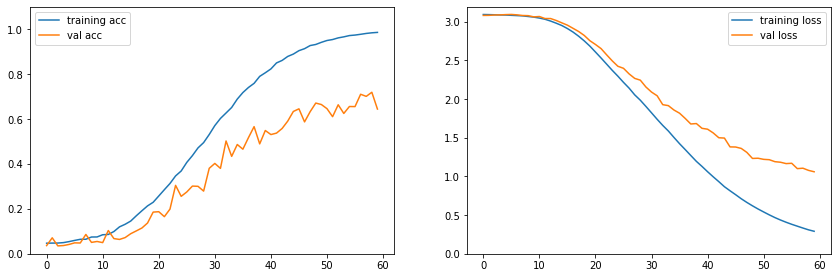

Confusion matrix, without normalization


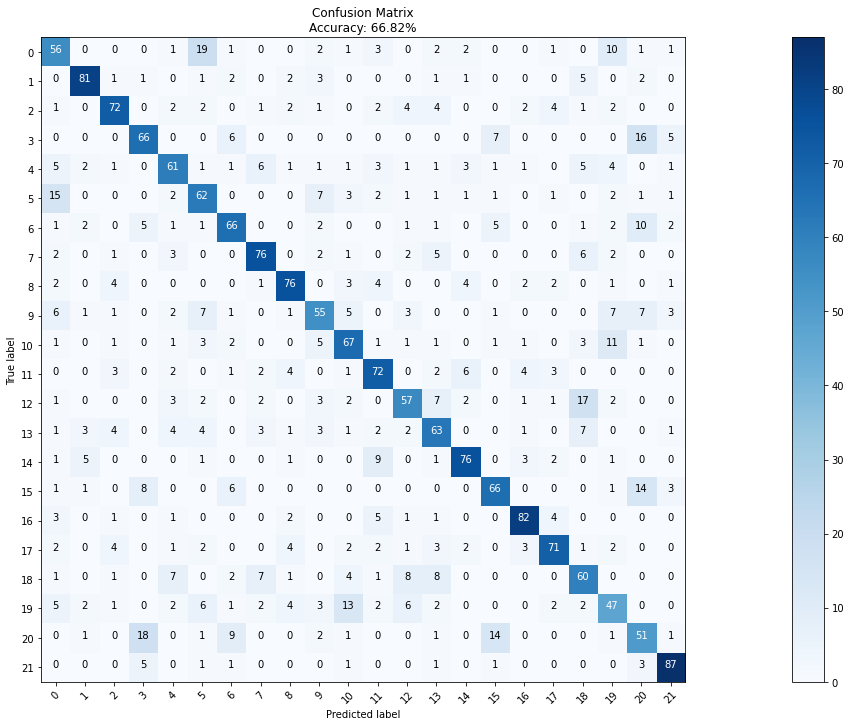

In [33]:
most_common_1k_pos_tri_and_fw('language', lr=0.001, epochs=60, num_classes=training_df_toks[LABEL].nunique(), collate_fn=True)

## Language Family Classification

In [65]:
training_chunks_num, test_chunks_num = 500, 30

training_df_pos, test_df_pos = prepare_data(POS_CHUNKS, 'family', -1, -1, training_chunks_num, test_chunks_num)
training_df_toks, test_df_toks = prepare_data(TOKENS_CHUNKS, 'family', -1, -1, training_chunks_num, test_chunks_num)

English 2181
Germanic 3346
Romance 1850
Slavic 1489

num of families: 4
Training size: 2000
Test size: 120
English 2181
Germanic 3346
Romance 1850
Slavic 1489

num of families: 4
Training size: 2000
Test size: 120


### Most Common 1K words, Binary Feature Vector

LanguageClassifierLSTM(
  (rnn): LSTM(1000, 128, batch_first=True)
  (fc): Linear(in_features=128, out_features=4, bias=True)
)
-----------------------------------
len(train_idx) = 1666
len(test_idx) = 334

Fold 1..........


Epoch #1	Train Loss: 1.284	Validation Loss: 1.128	Train Acc:0.51	Validation Acc:0.68


Epoch #2	Train Loss: 0.859	Validation Loss: 0.676	Train Acc:0.82	Validation Acc:0.86


Epoch #3	Train Loss: 0.464	Validation Loss: 0.424	Train Acc:0.91	Validation Acc:0.88


Epoch #4	Train Loss: 0.246	Validation Loss: 0.312	Train Acc:0.96	Validation Acc:0.91


Epoch #5	Train Loss: 0.175	Validation Loss: 0.253	Train Acc:0.97	Validation Acc:0.93


Epoch #6	Train Loss: 0.115	Validation Loss: 0.245	Train Acc:0.99	Validation Acc:0.94


Epoch #7	Train Loss: 0.078	Validation Loss: 0.188	Train Acc:0.99	Validation Acc:0.93


Epoch #8	Train Loss: 0.062	Validation Loss: 0.203	Train Acc:1.00	Validation Acc:0.93


Epoch #9	Train Loss: 0.044	Validation Loss: 0.217	Train Acc:1.00	Validation Acc:0.92


Epoch #10	Train Loss: 0.036	Validation Loss: 0.216	Train Acc:1.00	Validation Acc:0.93
-----------------------------------
len(train_idx) = 1666
len(test_idx) = 334

Fold 2..........


Epoch #1	Train Loss: 1.296	Validation Loss: 1.104	Train Acc:0.46	Validation Acc:0.67


Epoch #2	Train Loss: 0.858	Validation Loss: 0.633	Train Acc:0.79	Validation Acc:0.86


Epoch #3	Train Loss: 0.428	Validation Loss: 0.366	Train Acc:0.92	Validation Acc:0.93


Epoch #4	Train Loss: 0.228	Validation Loss: 0.261	Train Acc:0.97	Validation Acc:0.95


Epoch #5	Train Loss: 0.155	Validation Loss: 0.202	Train Acc:0.97	Validation Acc:0.95


Epoch #6	Train Loss: 0.105	Validation Loss: 0.174	Train Acc:0.99	Validation Acc:0.96


Epoch #7	Train Loss: 0.079	Validation Loss: 0.177	Train Acc:0.99	Validation Acc:0.94


Epoch #8	Train Loss: 0.076	Validation Loss: 0.154	Train Acc:0.98	Validation Acc:0.97


Epoch #9	Train Loss: 0.055	Validation Loss: 0.145	Train Acc:0.99	Validation Acc:0.96


Epoch #10	Train Loss: 0.035	Validation Loss: 0.138	Train Acc:1.00	Validation Acc:0.97
-----------------------------------
len(train_idx) = 1666
len(test_idx) = 334

Fold 3..........


Epoch #1	Train Loss: 1.327	Validation Loss: 1.205	Train Acc:0.41	Validation Acc:0.65


Epoch #2	Train Loss: 0.953	Validation Loss: 0.772	Train Acc:0.77	Validation Acc:0.81


Epoch #3	Train Loss: 0.502	Validation Loss: 0.427	Train Acc:0.91	Validation Acc:0.89


Epoch #4	Train Loss: 0.241	Validation Loss: 0.339	Train Acc:0.97	Validation Acc:0.88


Epoch #5	Train Loss: 0.149	Validation Loss: 0.277	Train Acc:0.98	Validation Acc:0.92


Epoch #6	Train Loss: 0.101	Validation Loss: 0.239	Train Acc:0.99	Validation Acc:0.91


Epoch #7	Train Loss: 0.072	Validation Loss: 0.227	Train Acc:1.00	Validation Acc:0.93


Epoch #8	Train Loss: 0.056	Validation Loss: 0.212	Train Acc:1.00	Validation Acc:0.93


Epoch #9	Train Loss: 0.041	Validation Loss: 0.246	Train Acc:1.00	Validation Acc:0.92


Epoch #10	Train Loss: 0.032	Validation Loss: 0.197	Train Acc:1.00	Validation Acc:0.94
-----------------------------------
len(train_idx) = 1666
len(test_idx) = 334

Fold 4..........


Epoch #1	Train Loss: 1.332	Validation Loss: 1.226	Train Acc:0.40	Validation Acc:0.53


Epoch #2	Train Loss: 0.953	Validation Loss: 0.783	Train Acc:0.78	Validation Acc:0.78


Epoch #3	Train Loss: 0.471	Validation Loss: 0.509	Train Acc:0.90	Validation Acc:0.82


Epoch #4	Train Loss: 0.239	Validation Loss: 0.354	Train Acc:0.96	Validation Acc:0.89


Epoch #5	Train Loss: 0.145	Validation Loss: 0.354	Train Acc:0.98	Validation Acc:0.89


Epoch #6	Train Loss: 0.091	Validation Loss: 0.374	Train Acc:0.99	Validation Acc:0.86


Epoch #7	Train Loss: 0.065	Validation Loss: 0.280	Train Acc:0.99	Validation Acc:0.91


Epoch #8	Train Loss: 0.047	Validation Loss: 0.302	Train Acc:1.00	Validation Acc:0.89


Epoch #9	Train Loss: 0.038	Validation Loss: 0.266	Train Acc:1.00	Validation Acc:0.90


Epoch #10	Train Loss: 0.033	Validation Loss: 0.255	Train Acc:1.00	Validation Acc:0.91
-----------------------------------
len(train_idx) = 1666
len(test_idx) = 334

Fold 5..........


Epoch #1	Train Loss: 1.305	Validation Loss: 1.171	Train Acc:0.46	Validation Acc:0.63


Epoch #2	Train Loss: 0.842	Validation Loss: 0.659	Train Acc:0.82	Validation Acc:0.81


Epoch #3	Train Loss: 0.377	Validation Loss: 0.371	Train Acc:0.94	Validation Acc:0.89


Epoch #4	Train Loss: 0.209	Validation Loss: 0.333	Train Acc:0.96	Validation Acc:0.90


Epoch #5	Train Loss: 0.110	Validation Loss: 0.279	Train Acc:0.98	Validation Acc:0.92


Epoch #6	Train Loss: 0.071	Validation Loss: 0.270	Train Acc:0.99	Validation Acc:0.91


Epoch #7	Train Loss: 0.052	Validation Loss: 0.286	Train Acc:1.00	Validation Acc:0.90


Epoch #8	Train Loss: 0.035	Validation Loss: 0.258	Train Acc:1.00	Validation Acc:0.92


Epoch #9	Train Loss: 0.029	Validation Loss: 0.267	Train Acc:1.00	Validation Acc:0.92


Epoch #10	Train Loss: 0.024	Validation Loss: 0.267	Train Acc:1.00	Validation Acc:0.90
-----------------------------------
len(train_idx) = 1670
len(test_idx) = 330

Fold 6..........


Epoch #1	Train Loss: 1.324	Validation Loss: 1.201	Train Acc:0.42	Validation Acc:0.71


Epoch #2	Train Loss: 0.935	Validation Loss: 0.710	Train Acc:0.80	Validation Acc:0.82


Epoch #3	Train Loss: 0.416	Validation Loss: 0.377	Train Acc:0.93	Validation Acc:0.91


Epoch #4	Train Loss: 0.209	Validation Loss: 0.326	Train Acc:0.97	Validation Acc:0.90


Epoch #5	Train Loss: 0.120	Validation Loss: 0.230	Train Acc:0.98	Validation Acc:0.95


Epoch #6	Train Loss: 0.083	Validation Loss: 0.279	Train Acc:0.99	Validation Acc:0.90


Epoch #7	Train Loss: 0.060	Validation Loss: 0.205	Train Acc:1.00	Validation Acc:0.93


Epoch #8	Train Loss: 0.044	Validation Loss: 0.186	Train Acc:1.00	Validation Acc:0.94


Epoch #9	Train Loss: 0.034	Validation Loss: 0.211	Train Acc:1.00	Validation Acc:0.92


Epoch #10	Train Loss: 0.028	Validation Loss: 0.183	Train Acc:1.00	Validation Acc:0.93


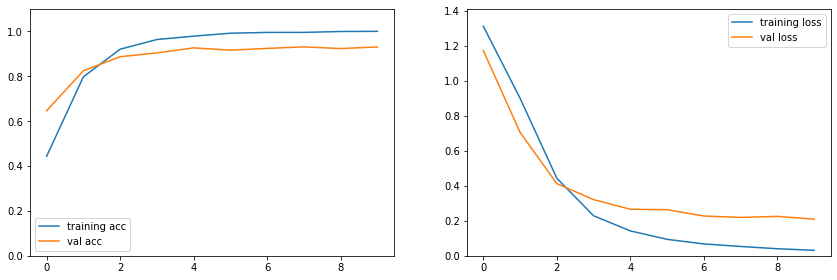

Confusion matrix, without normalization


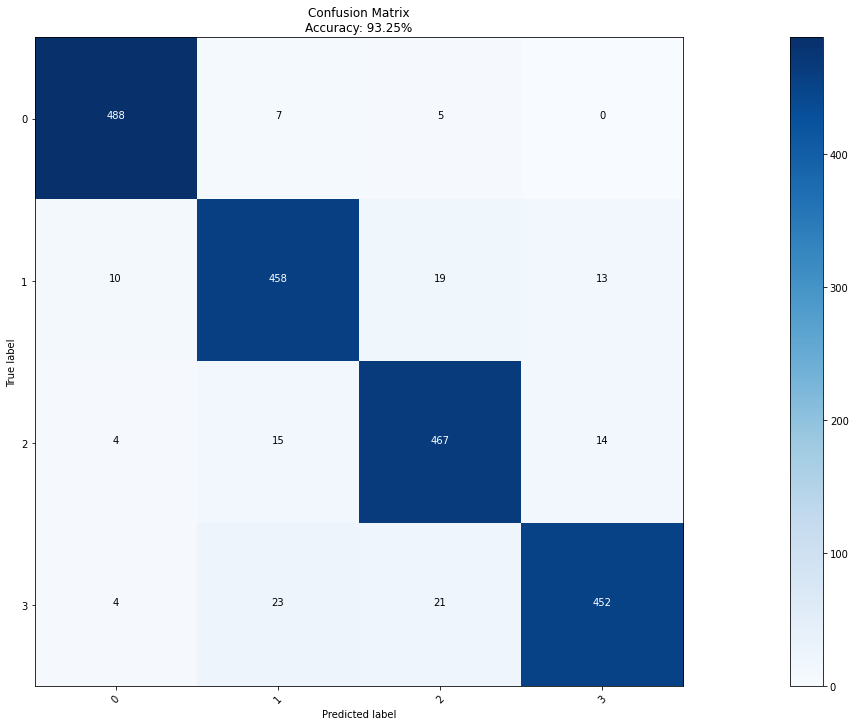

In [66]:
most_common_1k_words_binary_ftr_vec('family', lr=0.001, epochs=10, num_classes=training_df_toks[LABEL].nunique(), collate_fn=True)

### Most Common 1K POS TRI and FW, TFIDF

LanguageClassifierLSTM(
  (rnn): LSTM(1426, 128, batch_first=True)
  (fc): Linear(in_features=128, out_features=4, bias=True)
)
-----------------------------------
len(train_idx) = 1666
len(test_idx) = 334

Fold 1..........


Epoch #1	Train Loss: 1.388	Validation Loss: 1.384	Train Acc:0.25	Validation Acc:0.28


Epoch #2	Train Loss: 1.374	Validation Loss: 1.377	Train Acc:0.31	Validation Acc:0.25


Epoch #3	Train Loss: 1.367	Validation Loss: 1.365	Train Acc:0.32	Validation Acc:0.31


Epoch #4	Train Loss: 1.361	Validation Loss: 1.361	Train Acc:0.32	Validation Acc:0.38


Epoch #5	Train Loss: 1.343	Validation Loss: 1.333	Train Acc:0.38	Validation Acc:0.43


Epoch #6	Train Loss: 1.340	Validation Loss: 1.307	Train Acc:0.36	Validation Acc:0.42


Epoch #7	Train Loss: 1.295	Validation Loss: 1.282	Train Acc:0.44	Validation Acc:0.47


Epoch #8	Train Loss: 1.251	Validation Loss: 1.200	Train Acc:0.45	Validation Acc:0.57


Epoch #9	Train Loss: 1.168	Validation Loss: 1.143	Train Acc:0.55	Validation Acc:0.56


Epoch #10	Train Loss: 1.088	Validation Loss: 1.069	Train Acc:0.56	Validation Acc:0.57


Epoch #11	Train Loss: 1.001	Validation Loss: 0.991	Train Acc:0.63	Validation Acc:0.63


Epoch #12	Train Loss: 0.937	Validation Loss: 0.913	Train Acc:0.66	Validation Acc:0.69


Epoch #13	Train Loss: 0.849	Validation Loss: 0.830	Train Acc:0.71	Validation Acc:0.74


Epoch #14	Train Loss: 0.755	Validation Loss: 0.792	Train Acc:0.76	Validation Acc:0.70


Epoch #15	Train Loss: 0.688	Validation Loss: 0.730	Train Acc:0.80	Validation Acc:0.75


Epoch #16	Train Loss: 0.639	Validation Loss: 0.690	Train Acc:0.81	Validation Acc:0.74


Epoch #17	Train Loss: 0.568	Validation Loss: 0.672	Train Acc:0.84	Validation Acc:0.73


Epoch #18	Train Loss: 0.554	Validation Loss: 0.598	Train Acc:0.85	Validation Acc:0.78


Epoch #19	Train Loss: 0.489	Validation Loss: 0.553	Train Acc:0.86	Validation Acc:0.82


Epoch #20	Train Loss: 0.429	Validation Loss: 0.545	Train Acc:0.90	Validation Acc:0.79


Epoch #21	Train Loss: 0.376	Validation Loss: 0.535	Train Acc:0.90	Validation Acc:0.81


Epoch #22	Train Loss: 0.364	Validation Loss: 0.500	Train Acc:0.90	Validation Acc:0.82


Epoch #23	Train Loss: 0.341	Validation Loss: 0.456	Train Acc:0.92	Validation Acc:0.84


Epoch #24	Train Loss: 0.318	Validation Loss: 0.487	Train Acc:0.91	Validation Acc:0.81


Epoch #25	Train Loss: 0.289	Validation Loss: 0.500	Train Acc:0.93	Validation Acc:0.82


Epoch #26	Train Loss: 0.291	Validation Loss: 0.412	Train Acc:0.92	Validation Acc:0.84


Epoch #27	Train Loss: 0.253	Validation Loss: 0.426	Train Acc:0.94	Validation Acc:0.84


Epoch #28	Train Loss: 0.233	Validation Loss: 0.364	Train Acc:0.94	Validation Acc:0.87


Epoch #29	Train Loss: 0.222	Validation Loss: 0.411	Train Acc:0.94	Validation Acc:0.85


Epoch #30	Train Loss: 0.210	Validation Loss: 0.439	Train Acc:0.96	Validation Acc:0.83


Epoch #31	Train Loss: 0.202	Validation Loss: 0.423	Train Acc:0.95	Validation Acc:0.85


Epoch #32	Train Loss: 0.186	Validation Loss: 0.403	Train Acc:0.96	Validation Acc:0.83


Epoch #33	Train Loss: 0.168	Validation Loss: 0.370	Train Acc:0.96	Validation Acc:0.87


Epoch #34	Train Loss: 0.164	Validation Loss: 0.391	Train Acc:0.96	Validation Acc:0.86


Epoch #35	Train Loss: 0.150	Validation Loss: 0.416	Train Acc:0.97	Validation Acc:0.83


Epoch #36	Train Loss: 0.146	Validation Loss: 0.378	Train Acc:0.97	Validation Acc:0.86


Epoch #37	Train Loss: 0.132	Validation Loss: 0.381	Train Acc:0.97	Validation Acc:0.84


Epoch #38	Train Loss: 0.125	Validation Loss: 0.394	Train Acc:0.98	Validation Acc:0.83


Epoch #39	Train Loss: 0.123	Validation Loss: 0.462	Train Acc:0.98	Validation Acc:0.85


Epoch #40	Train Loss: 0.120	Validation Loss: 0.437	Train Acc:0.98	Validation Acc:0.84
-----------------------------------
len(train_idx) = 1666
len(test_idx) = 334

Fold 2..........


Epoch #1	Train Loss: 1.389	Validation Loss: 1.388	Train Acc:0.25	Validation Acc:0.24


Epoch #2	Train Loss: 1.383	Validation Loss: 1.393	Train Acc:0.27	Validation Acc:0.23


Epoch #3	Train Loss: 1.382	Validation Loss: 1.390	Train Acc:0.28	Validation Acc:0.25


Epoch #4	Train Loss: 1.380	Validation Loss: 1.391	Train Acc:0.29	Validation Acc:0.27


Epoch #5	Train Loss: 1.382	Validation Loss: 1.383	Train Acc:0.26	Validation Acc:0.29


Epoch #6	Train Loss: 1.373	Validation Loss: 1.376	Train Acc:0.31	Validation Acc:0.29


Epoch #7	Train Loss: 1.371	Validation Loss: 1.390	Train Acc:0.30	Validation Acc:0.29


Epoch #8	Train Loss: 1.367	Validation Loss: 1.365	Train Acc:0.32	Validation Acc:0.33


Epoch #9	Train Loss: 1.353	Validation Loss: 1.346	Train Acc:0.36	Validation Acc:0.34


Epoch #10	Train Loss: 1.327	Validation Loss: 1.344	Train Acc:0.40	Validation Acc:0.37


Epoch #11	Train Loss: 1.319	Validation Loss: 1.341	Train Acc:0.41	Validation Acc:0.35


Epoch #12	Train Loss: 1.295	Validation Loss: 1.306	Train Acc:0.43	Validation Acc:0.40


Epoch #13	Train Loss: 1.269	Validation Loss: 1.257	Train Acc:0.44	Validation Acc:0.44


Epoch #14	Train Loss: 1.227	Validation Loss: 1.224	Train Acc:0.49	Validation Acc:0.47


Epoch #15	Train Loss: 1.155	Validation Loss: 1.197	Train Acc:0.53	Validation Acc:0.45


Epoch #16	Train Loss: 1.101	Validation Loss: 1.136	Train Acc:0.58	Validation Acc:0.52


Epoch #17	Train Loss: 1.031	Validation Loss: 1.085	Train Acc:0.60	Validation Acc:0.54


Epoch #18	Train Loss: 0.965	Validation Loss: 1.079	Train Acc:0.64	Validation Acc:0.54


Epoch #19	Train Loss: 0.936	Validation Loss: 0.976	Train Acc:0.68	Validation Acc:0.61


Epoch #20	Train Loss: 0.868	Validation Loss: 0.938	Train Acc:0.71	Validation Acc:0.64


Epoch #21	Train Loss: 0.827	Validation Loss: 0.896	Train Acc:0.70	Validation Acc:0.67


Epoch #22	Train Loss: 0.763	Validation Loss: 0.877	Train Acc:0.75	Validation Acc:0.68


Epoch #23	Train Loss: 0.738	Validation Loss: 0.855	Train Acc:0.76	Validation Acc:0.71


Epoch #24	Train Loss: 0.669	Validation Loss: 0.803	Train Acc:0.80	Validation Acc:0.70


Epoch #25	Train Loss: 0.615	Validation Loss: 0.771	Train Acc:0.82	Validation Acc:0.75


Epoch #26	Train Loss: 0.579	Validation Loss: 0.786	Train Acc:0.84	Validation Acc:0.75


Epoch #27	Train Loss: 0.534	Validation Loss: 0.697	Train Acc:0.85	Validation Acc:0.79


Epoch #28	Train Loss: 0.492	Validation Loss: 0.717	Train Acc:0.88	Validation Acc:0.75


Epoch #29	Train Loss: 0.453	Validation Loss: 0.654	Train Acc:0.88	Validation Acc:0.75


Epoch #30	Train Loss: 0.424	Validation Loss: 0.621	Train Acc:0.88	Validation Acc:0.78


Epoch #31	Train Loss: 0.389	Validation Loss: 0.596	Train Acc:0.91	Validation Acc:0.80


Epoch #32	Train Loss: 0.398	Validation Loss: 0.569	Train Acc:0.89	Validation Acc:0.83


Epoch #33	Train Loss: 0.348	Validation Loss: 0.564	Train Acc:0.91	Validation Acc:0.80


Epoch #34	Train Loss: 0.345	Validation Loss: 0.600	Train Acc:0.90	Validation Acc:0.77


Epoch #35	Train Loss: 0.328	Validation Loss: 0.574	Train Acc:0.90	Validation Acc:0.78


Epoch #36	Train Loss: 0.307	Validation Loss: 0.566	Train Acc:0.91	Validation Acc:0.78


Epoch #37	Train Loss: 0.264	Validation Loss: 0.517	Train Acc:0.94	Validation Acc:0.85


Epoch #38	Train Loss: 0.243	Validation Loss: 0.483	Train Acc:0.95	Validation Acc:0.82


Epoch #39	Train Loss: 0.244	Validation Loss: 0.504	Train Acc:0.93	Validation Acc:0.81


Epoch #40	Train Loss: 0.248	Validation Loss: 0.499	Train Acc:0.94	Validation Acc:0.84
-----------------------------------
len(train_idx) = 1666
len(test_idx) = 334

Fold 3..........


Epoch #1	Train Loss: 1.389	Validation Loss: 1.393	Train Acc:0.27	Validation Acc:0.19


Epoch #2	Train Loss: 1.385	Validation Loss: 1.380	Train Acc:0.26	Validation Acc:0.30


Epoch #3	Train Loss: 1.383	Validation Loss: 1.393	Train Acc:0.26	Validation Acc:0.24


Epoch #4	Train Loss: 1.377	Validation Loss: 1.383	Train Acc:0.28	Validation Acc:0.27


Epoch #5	Train Loss: 1.375	Validation Loss: 1.373	Train Acc:0.29	Validation Acc:0.30


Epoch #6	Train Loss: 1.366	Validation Loss: 1.375	Train Acc:0.34	Validation Acc:0.28


Epoch #7	Train Loss: 1.364	Validation Loss: 1.366	Train Acc:0.31	Validation Acc:0.31


Epoch #8	Train Loss: 1.349	Validation Loss: 1.338	Train Acc:0.36	Validation Acc:0.37


Epoch #9	Train Loss: 1.338	Validation Loss: 1.317	Train Acc:0.36	Validation Acc:0.38


Epoch #10	Train Loss: 1.305	Validation Loss: 1.301	Train Acc:0.41	Validation Acc:0.38


Epoch #11	Train Loss: 1.253	Validation Loss: 1.287	Train Acc:0.44	Validation Acc:0.39


Epoch #12	Train Loss: 1.201	Validation Loss: 1.229	Train Acc:0.50	Validation Acc:0.46


Epoch #13	Train Loss: 1.158	Validation Loss: 1.160	Train Acc:0.50	Validation Acc:0.52


Epoch #14	Train Loss: 1.077	Validation Loss: 1.086	Train Acc:0.57	Validation Acc:0.54


Epoch #15	Train Loss: 1.019	Validation Loss: 0.984	Train Acc:0.62	Validation Acc:0.62


Epoch #16	Train Loss: 0.940	Validation Loss: 0.972	Train Acc:0.64	Validation Acc:0.60


Epoch #17	Train Loss: 0.885	Validation Loss: 0.899	Train Acc:0.70	Validation Acc:0.67


Epoch #18	Train Loss: 0.810	Validation Loss: 0.874	Train Acc:0.76	Validation Acc:0.67


Epoch #19	Train Loss: 0.766	Validation Loss: 0.808	Train Acc:0.75	Validation Acc:0.72


Epoch #20	Train Loss: 0.755	Validation Loss: 0.765	Train Acc:0.73	Validation Acc:0.73


Epoch #21	Train Loss: 0.675	Validation Loss: 0.723	Train Acc:0.80	Validation Acc:0.74


Epoch #22	Train Loss: 0.637	Validation Loss: 0.701	Train Acc:0.82	Validation Acc:0.77


Epoch #23	Train Loss: 0.560	Validation Loss: 0.656	Train Acc:0.85	Validation Acc:0.78


Epoch #24	Train Loss: 0.516	Validation Loss: 0.639	Train Acc:0.87	Validation Acc:0.78


Epoch #25	Train Loss: 0.486	Validation Loss: 0.589	Train Acc:0.87	Validation Acc:0.80


Epoch #26	Train Loss: 0.463	Validation Loss: 0.589	Train Acc:0.88	Validation Acc:0.79


Epoch #27	Train Loss: 0.420	Validation Loss: 0.568	Train Acc:0.90	Validation Acc:0.83


Epoch #28	Train Loss: 0.405	Validation Loss: 0.552	Train Acc:0.90	Validation Acc:0.82


Epoch #29	Train Loss: 0.365	Validation Loss: 0.505	Train Acc:0.91	Validation Acc:0.85


Epoch #30	Train Loss: 0.338	Validation Loss: 0.530	Train Acc:0.93	Validation Acc:0.79


Epoch #31	Train Loss: 0.312	Validation Loss: 0.457	Train Acc:0.92	Validation Acc:0.86


Epoch #32	Train Loss: 0.282	Validation Loss: 0.486	Train Acc:0.94	Validation Acc:0.84


Epoch #33	Train Loss: 0.270	Validation Loss: 0.438	Train Acc:0.93	Validation Acc:0.84


Epoch #34	Train Loss: 0.263	Validation Loss: 0.426	Train Acc:0.94	Validation Acc:0.86


Epoch #35	Train Loss: 0.253	Validation Loss: 0.443	Train Acc:0.94	Validation Acc:0.85


Epoch #36	Train Loss: 0.224	Validation Loss: 0.390	Train Acc:0.95	Validation Acc:0.88


Epoch #37	Train Loss: 0.211	Validation Loss: 0.417	Train Acc:0.95	Validation Acc:0.86


Epoch #38	Train Loss: 0.202	Validation Loss: 0.492	Train Acc:0.95	Validation Acc:0.83


Epoch #39	Train Loss: 0.196	Validation Loss: 0.417	Train Acc:0.96	Validation Acc:0.85


Epoch #40	Train Loss: 0.188	Validation Loss: 0.388	Train Acc:0.96	Validation Acc:0.86
-----------------------------------
len(train_idx) = 1666
len(test_idx) = 334

Fold 4..........


Epoch #1	Train Loss: 1.390	Validation Loss: 1.391	Train Acc:0.25	Validation Acc:0.21


Epoch #2	Train Loss: 1.384	Validation Loss: 1.391	Train Acc:0.27	Validation Acc:0.22


Epoch #3	Train Loss: 1.384	Validation Loss: 1.384	Train Acc:0.27	Validation Acc:0.29


Epoch #4	Train Loss: 1.379	Validation Loss: 1.381	Train Acc:0.29	Validation Acc:0.27


Epoch #5	Train Loss: 1.382	Validation Loss: 1.386	Train Acc:0.31	Validation Acc:0.26


Epoch #6	Train Loss: 1.375	Validation Loss: 1.364	Train Acc:0.31	Validation Acc:0.32


Epoch #7	Train Loss: 1.367	Validation Loss: 1.373	Train Acc:0.31	Validation Acc:0.29


Epoch #8	Train Loss: 1.355	Validation Loss: 1.361	Train Acc:0.36	Validation Acc:0.30


Epoch #9	Train Loss: 1.348	Validation Loss: 1.342	Train Acc:0.36	Validation Acc:0.38


Epoch #10	Train Loss: 1.305	Validation Loss: 1.317	Train Acc:0.45	Validation Acc:0.39


Epoch #11	Train Loss: 1.289	Validation Loss: 1.269	Train Acc:0.45	Validation Acc:0.42


Epoch #12	Train Loss: 1.230	Validation Loss: 1.240	Train Acc:0.47	Validation Acc:0.47


Epoch #13	Train Loss: 1.137	Validation Loss: 1.209	Train Acc:0.54	Validation Acc:0.46


Epoch #14	Train Loss: 1.103	Validation Loss: 1.112	Train Acc:0.58	Validation Acc:0.54


Epoch #15	Train Loss: 1.029	Validation Loss: 1.068	Train Acc:0.58	Validation Acc:0.58


Epoch #16	Train Loss: 0.921	Validation Loss: 0.986	Train Acc:0.70	Validation Acc:0.63


Epoch #17	Train Loss: 0.867	Validation Loss: 0.935	Train Acc:0.70	Validation Acc:0.66


Epoch #18	Train Loss: 0.797	Validation Loss: 0.915	Train Acc:0.72	Validation Acc:0.66


Epoch #19	Train Loss: 0.745	Validation Loss: 0.828	Train Acc:0.76	Validation Acc:0.72


Epoch #20	Train Loss: 0.678	Validation Loss: 0.774	Train Acc:0.80	Validation Acc:0.73


Epoch #21	Train Loss: 0.668	Validation Loss: 0.787	Train Acc:0.79	Validation Acc:0.67


Epoch #22	Train Loss: 0.594	Validation Loss: 0.725	Train Acc:0.81	Validation Acc:0.77


Epoch #23	Train Loss: 0.542	Validation Loss: 0.662	Train Acc:0.86	Validation Acc:0.75


Epoch #24	Train Loss: 0.525	Validation Loss: 0.664	Train Acc:0.85	Validation Acc:0.78


Epoch #25	Train Loss: 0.468	Validation Loss: 0.649	Train Acc:0.89	Validation Acc:0.75


Epoch #26	Train Loss: 0.422	Validation Loss: 0.617	Train Acc:0.89	Validation Acc:0.75


Epoch #27	Train Loss: 0.399	Validation Loss: 0.574	Train Acc:0.89	Validation Acc:0.77


Epoch #28	Train Loss: 0.376	Validation Loss: 0.564	Train Acc:0.91	Validation Acc:0.78


Epoch #29	Train Loss: 0.359	Validation Loss: 0.563	Train Acc:0.89	Validation Acc:0.80


Epoch #30	Train Loss: 0.316	Validation Loss: 0.535	Train Acc:0.93	Validation Acc:0.78


Epoch #31	Train Loss: 0.292	Validation Loss: 0.546	Train Acc:0.93	Validation Acc:0.79


Epoch #32	Train Loss: 0.265	Validation Loss: 0.443	Train Acc:0.94	Validation Acc:0.84


Epoch #33	Train Loss: 0.256	Validation Loss: 0.471	Train Acc:0.94	Validation Acc:0.83


Epoch #34	Train Loss: 0.240	Validation Loss: 0.452	Train Acc:0.94	Validation Acc:0.82


Epoch #35	Train Loss: 0.230	Validation Loss: 0.516	Train Acc:0.96	Validation Acc:0.79


Epoch #36	Train Loss: 0.219	Validation Loss: 0.470	Train Acc:0.95	Validation Acc:0.82


Epoch #37	Train Loss: 0.205	Validation Loss: 0.436	Train Acc:0.96	Validation Acc:0.82


Epoch #38	Train Loss: 0.183	Validation Loss: 0.489	Train Acc:0.95	Validation Acc:0.83


Epoch #39	Train Loss: 0.178	Validation Loss: 0.415	Train Acc:0.97	Validation Acc:0.83


Epoch #40	Train Loss: 0.160	Validation Loss: 0.436	Train Acc:0.97	Validation Acc:0.83
-----------------------------------
len(train_idx) = 1666
len(test_idx) = 334

Fold 5..........


Epoch #1	Train Loss: 1.387	Validation Loss: 1.394	Train Acc:0.25	Validation Acc:0.22


Epoch #2	Train Loss: 1.383	Validation Loss: 1.386	Train Acc:0.26	Validation Acc:0.25


Epoch #3	Train Loss: 1.382	Validation Loss: 1.396	Train Acc:0.27	Validation Acc:0.22


Epoch #4	Train Loss: 1.376	Validation Loss: 1.390	Train Acc:0.28	Validation Acc:0.22


Epoch #5	Train Loss: 1.373	Validation Loss: 1.380	Train Acc:0.33	Validation Acc:0.29


Epoch #6	Train Loss: 1.373	Validation Loss: 1.367	Train Acc:0.29	Validation Acc:0.32


Epoch #7	Train Loss: 1.361	Validation Loss: 1.349	Train Acc:0.30	Validation Acc:0.38


Epoch #8	Train Loss: 1.339	Validation Loss: 1.355	Train Acc:0.37	Validation Acc:0.35


Epoch #9	Train Loss: 1.319	Validation Loss: 1.308	Train Acc:0.38	Validation Acc:0.42


Epoch #10	Train Loss: 1.294	Validation Loss: 1.266	Train Acc:0.41	Validation Acc:0.42


Epoch #11	Train Loss: 1.238	Validation Loss: 1.201	Train Acc:0.46	Validation Acc:0.50


Epoch #12	Train Loss: 1.194	Validation Loss: 1.157	Train Acc:0.49	Validation Acc:0.57


Epoch #13	Train Loss: 1.110	Validation Loss: 1.077	Train Acc:0.58	Validation Acc:0.60


Epoch #14	Train Loss: 1.068	Validation Loss: 1.000	Train Acc:0.55	Validation Acc:0.61


Epoch #15	Train Loss: 0.981	Validation Loss: 0.949	Train Acc:0.64	Validation Acc:0.67


Epoch #16	Train Loss: 0.931	Validation Loss: 0.899	Train Acc:0.66	Validation Acc:0.68


Epoch #17	Train Loss: 0.851	Validation Loss: 0.864	Train Acc:0.73	Validation Acc:0.71


Epoch #18	Train Loss: 0.814	Validation Loss: 0.803	Train Acc:0.72	Validation Acc:0.73


Epoch #19	Train Loss: 0.739	Validation Loss: 0.764	Train Acc:0.77	Validation Acc:0.78


Epoch #20	Train Loss: 0.682	Validation Loss: 0.698	Train Acc:0.79	Validation Acc:0.73


Epoch #21	Train Loss: 0.644	Validation Loss: 0.648	Train Acc:0.82	Validation Acc:0.78


Epoch #22	Train Loss: 0.585	Validation Loss: 0.675	Train Acc:0.83	Validation Acc:0.78


Epoch #23	Train Loss: 0.563	Validation Loss: 0.622	Train Acc:0.83	Validation Acc:0.79


Epoch #24	Train Loss: 0.485	Validation Loss: 0.576	Train Acc:0.88	Validation Acc:0.82


Epoch #25	Train Loss: 0.441	Validation Loss: 0.545	Train Acc:0.88	Validation Acc:0.84


Epoch #26	Train Loss: 0.422	Validation Loss: 0.544	Train Acc:0.88	Validation Acc:0.81


Epoch #27	Train Loss: 0.370	Validation Loss: 0.488	Train Acc:0.91	Validation Acc:0.83


Epoch #28	Train Loss: 0.347	Validation Loss: 0.465	Train Acc:0.91	Validation Acc:0.84


Epoch #29	Train Loss: 0.354	Validation Loss: 0.429	Train Acc:0.92	Validation Acc:0.87


Epoch #30	Train Loss: 0.311	Validation Loss: 0.464	Train Acc:0.93	Validation Acc:0.84


Epoch #31	Train Loss: 0.301	Validation Loss: 0.434	Train Acc:0.93	Validation Acc:0.84


Epoch #32	Train Loss: 0.271	Validation Loss: 0.434	Train Acc:0.93	Validation Acc:0.86


Epoch #33	Train Loss: 0.259	Validation Loss: 0.417	Train Acc:0.93	Validation Acc:0.85


Epoch #34	Train Loss: 0.237	Validation Loss: 0.414	Train Acc:0.95	Validation Acc:0.84


Epoch #35	Train Loss: 0.227	Validation Loss: 0.447	Train Acc:0.95	Validation Acc:0.83


Epoch #36	Train Loss: 0.218	Validation Loss: 0.397	Train Acc:0.94	Validation Acc:0.83


Epoch #37	Train Loss: 0.204	Validation Loss: 0.375	Train Acc:0.96	Validation Acc:0.88


Epoch #38	Train Loss: 0.188	Validation Loss: 0.399	Train Acc:0.96	Validation Acc:0.85


Epoch #39	Train Loss: 0.179	Validation Loss: 0.374	Train Acc:0.96	Validation Acc:0.87


Epoch #40	Train Loss: 0.187	Validation Loss: 0.337	Train Acc:0.97	Validation Acc:0.88
-----------------------------------
len(train_idx) = 1670
len(test_idx) = 330

Fold 6..........


Epoch #1	Train Loss: 1.389	Validation Loss: 1.382	Train Acc:0.24	Validation Acc:0.27


Epoch #2	Train Loss: 1.385	Validation Loss: 1.384	Train Acc:0.27	Validation Acc:0.28


Epoch #3	Train Loss: 1.384	Validation Loss: 1.385	Train Acc:0.28	Validation Acc:0.32


Epoch #4	Train Loss: 1.381	Validation Loss: 1.380	Train Acc:0.28	Validation Acc:0.24


Epoch #5	Train Loss: 1.377	Validation Loss: 1.371	Train Acc:0.30	Validation Acc:0.35


Epoch #6	Train Loss: 1.368	Validation Loss: 1.381	Train Acc:0.31	Validation Acc:0.27


Epoch #7	Train Loss: 1.361	Validation Loss: 1.360	Train Acc:0.33	Validation Acc:0.30


Epoch #8	Train Loss: 1.347	Validation Loss: 1.351	Train Acc:0.37	Validation Acc:0.34


Epoch #9	Train Loss: 1.324	Validation Loss: 1.316	Train Acc:0.38	Validation Acc:0.39


Epoch #10	Train Loss: 1.290	Validation Loss: 1.266	Train Acc:0.44	Validation Acc:0.47


Epoch #11	Train Loss: 1.220	Validation Loss: 1.226	Train Acc:0.50	Validation Acc:0.45


Epoch #12	Train Loss: 1.153	Validation Loss: 1.163	Train Acc:0.56	Validation Acc:0.51


Epoch #13	Train Loss: 1.073	Validation Loss: 1.071	Train Acc:0.60	Validation Acc:0.60


Epoch #14	Train Loss: 0.994	Validation Loss: 1.048	Train Acc:0.65	Validation Acc:0.57


Epoch #15	Train Loss: 0.914	Validation Loss: 0.978	Train Acc:0.69	Validation Acc:0.63


Epoch #16	Train Loss: 0.852	Validation Loss: 0.882	Train Acc:0.71	Validation Acc:0.70


Epoch #17	Train Loss: 0.794	Validation Loss: 0.829	Train Acc:0.76	Validation Acc:0.67


Epoch #18	Train Loss: 0.711	Validation Loss: 0.733	Train Acc:0.79	Validation Acc:0.77


Epoch #19	Train Loss: 0.677	Validation Loss: 0.767	Train Acc:0.79	Validation Acc:0.75


Epoch #20	Train Loss: 0.610	Validation Loss: 0.711	Train Acc:0.83	Validation Acc:0.77


Epoch #21	Train Loss: 0.546	Validation Loss: 0.630	Train Acc:0.85	Validation Acc:0.80


Epoch #22	Train Loss: 0.512	Validation Loss: 0.573	Train Acc:0.85	Validation Acc:0.81


Epoch #23	Train Loss: 0.470	Validation Loss: 0.581	Train Acc:0.87	Validation Acc:0.79


Epoch #24	Train Loss: 0.442	Validation Loss: 0.542	Train Acc:0.87	Validation Acc:0.83


Epoch #25	Train Loss: 0.399	Validation Loss: 0.547	Train Acc:0.90	Validation Acc:0.81


Epoch #26	Train Loss: 0.372	Validation Loss: 0.543	Train Acc:0.92	Validation Acc:0.80


Epoch #27	Train Loss: 0.330	Validation Loss: 0.513	Train Acc:0.93	Validation Acc:0.85


Epoch #28	Train Loss: 0.315	Validation Loss: 0.509	Train Acc:0.92	Validation Acc:0.80


Epoch #29	Train Loss: 0.290	Validation Loss: 0.541	Train Acc:0.93	Validation Acc:0.80


Epoch #30	Train Loss: 0.283	Validation Loss: 0.567	Train Acc:0.93	Validation Acc:0.82


Epoch #31	Train Loss: 0.263	Validation Loss: 0.439	Train Acc:0.94	Validation Acc:0.86


Epoch #32	Train Loss: 0.240	Validation Loss: 0.447	Train Acc:0.94	Validation Acc:0.81


Epoch #33	Train Loss: 0.223	Validation Loss: 0.409	Train Acc:0.95	Validation Acc:0.88


Epoch #34	Train Loss: 0.215	Validation Loss: 0.411	Train Acc:0.96	Validation Acc:0.86


Epoch #35	Train Loss: 0.195	Validation Loss: 0.455	Train Acc:0.96	Validation Acc:0.84


Epoch #36	Train Loss: 0.194	Validation Loss: 0.443	Train Acc:0.95	Validation Acc:0.83


Epoch #37	Train Loss: 0.179	Validation Loss: 0.370	Train Acc:0.96	Validation Acc:0.86


Epoch #38	Train Loss: 0.164	Validation Loss: 0.389	Train Acc:0.97	Validation Acc:0.84


Epoch #39	Train Loss: 0.155	Validation Loss: 0.410	Train Acc:0.97	Validation Acc:0.85


Epoch #40	Train Loss: 0.154	Validation Loss: 0.464	Train Acc:0.98	Validation Acc:0.85


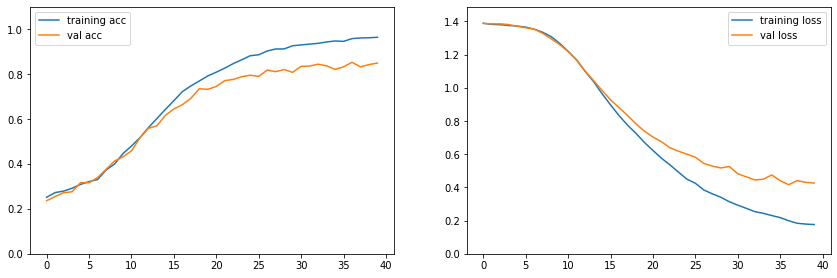

Confusion matrix, without normalization


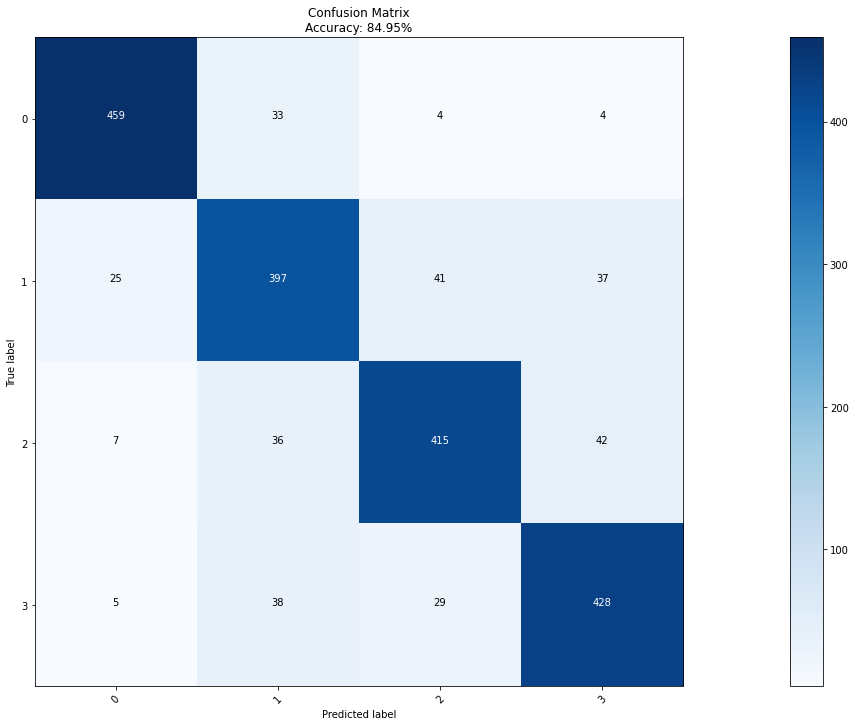

In [69]:
most_common_1k_pos_tri_and_fw('family', lr=0.001, epochs=40, num_classes=training_df_toks[LABEL].nunique(), collate_fn=True)